# From here all individual extractor performance analysis

### aac extractor

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.828125  0.662419   
ExtraTreesClassifier(random_state=10)               0.906250  0.812897   
KNeighborsClassifier()                              0.764062  0.531563   
RandomForestClassifier(criterion='entropy', ran...  0.876875  0.754710   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.657254   0.785714   
ExtraTreesClassifier(random_state=10)               0.812500   0.890625   
KNeighborsClassifier()                              0.529082   0.733299   
RandomForestClassifier(criterion='entropy', ran...  0.753860   0.856183   

                                                      recall        f1  \
Classifier       

<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-12-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-12-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-12-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In 

### cv performance on 4 model by aac dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-13-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-13-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-13-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-13-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-13-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.772090  0.548049   
ExtraTreesClassifier(random_state=10)               0.839455  0.682507   
KNeighborsClassifier()                              0.762044  0.527689   
RandomForestClassifier(criterion='entropy', ran...  0.842655  0.689190   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.544126   0.774545   
ExtraTreesClassifier(random_state=10)               0.678865   0.846224   
KNeighborsClassifier()                              0.524042   0.762802   
RandomForestClassifier(criterion='entropy', ran...  0.685269   0.850537   

                                                      recall        f1  \
Classifier       

### main model by aac dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0229 - accuracy: 0.9829 - val_loss: 0.5105 - val_accuracy: 0.9709
Epoch 113/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0263 - accuracy: 0.9902 - val_loss: 0.5189 - val_accuracy: 0.9709
Epoch 114/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0311 - accuracy: 0.9902 - val_loss: 0.5067 - val_accuracy: 0.9709
Epoch 115/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0209 - accuracy: 0.9902 - val_loss: 0.5143 - val_accuracy: 0.9709
Epoch 116/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0227 - accuracy: 0.9853 - val_loss: 0.5322 - val_accuracy: 0.9709
Epoch 117/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0307 - accuracy: 0.9878 - val_loss: 0.5220 - val_accuracy: 0.9709
Epoch 118/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0252 - a

### main cv aac dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
13/13 [==============================] - 1s 20ms/step - loss: 0.7016 - accuracy: 0.5525 - val_loss: 0.5714 - val_accuracy: 0.9307
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5986 - accuracy: 0.7225 - val_loss: 0.4363 - val_accuracy: 0.9307
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.4471 - accuracy: 0.8300 - val_loss: 0.2351 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2719 - accuracy: 0.9000 - val_loss: 0.1328 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1880 - accuracy: 0.9325 - val_loss: 0.1116 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1360 - accuracy: 0.9575 - val_loss: 0.1049 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1055 - accuracy: 0.9750 - val_loss: 0.0976 - val_accuracy: 0.9505
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 20ms/step - loss: 0.6811 - accuracy: 0.5400 - val_loss: 0.5944 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5809 - accuracy: 0.7200 - val_loss: 0.4305 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.4169 - accuracy: 0.8500 - val_loss: 0.2331 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2651 - accuracy: 0.9275 - val_loss: 0.1721 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1665 - accuracy: 0.9475 - val_loss: 0.1792 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.0965 - accuracy: 0.9750 - val_loss: 0.1936 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1315 - accuracy: 0.9625 - val_loss: 0.2031 - val_accuracy: 0.9604
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.7174 - accuracy: 0.5350 - val_loss: 0.5594 - val_accuracy: 0.9307
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5797 - accuracy: 0.7150 - val_loss: 0.4053 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4047 - accuracy: 0.8650 - val_loss: 0.2220 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2505 - accuracy: 0.9275 - val_loss: 0.1457 - val_accuracy: 0.9604
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1780 - accuracy: 0.9425 - val_loss: 0.1457 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0943 - accuracy: 0.9800 - val_loss: 0.1664 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1183 - accuracy: 0.9775 - val_loss: 0.1843 - val_accuracy: 0.9604
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.7231 - accuracy: 0.5475 - val_loss: 0.6145 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6017 - accuracy: 0.6700 - val_loss: 0.4599 - val_accuracy: 0.9307
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4389 - accuracy: 0.8400 - val_loss: 0.2781 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.3114 - accuracy: 0.9200 - val_loss: 0.1709 - val_accuracy: 0.9307
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.2081 - accuracy: 0.9375 - val_loss: 0.1593 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1674 - accuracy: 0.9550 - val_loss: 0.1614 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1118 - accuracy: 0.9625 - val_loss: 0.1621 - val_accuracy: 0.9703
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 21ms/step - loss: 0.7269 - accuracy: 0.5175 - val_loss: 0.6301 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6177 - accuracy: 0.7050 - val_loss: 0.4578 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4513 - accuracy: 0.8275 - val_loss: 0.2640 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2760 - accuracy: 0.9175 - val_loss: 0.1970 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1724 - accuracy: 0.9525 - val_loss: 0.2238 - val_accuracy: 0.9406
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1163 - accuracy: 0.9675 - val_loss: 0.2351 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1033 - accuracy: 0.9725 - val_loss: 0.2448 - val_accuracy: 0.9505
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.6870 - accuracy: 0.5950 - val_loss: 0.5653 - val_accuracy: 0.9307
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5713 - accuracy: 0.7450 - val_loss: 0.3831 - val_accuracy: 0.9307
Epoch 3/200
13/13 [==============================] - 0s 6ms/step - loss: 0.3605 - accuracy: 0.8900 - val_loss: 0.1894 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2179 - accuracy: 0.9475 - val_loss: 0.1467 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1268 - accuracy: 0.9650 - val_loss: 0.1428 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1095 - accuracy: 0.9675 - val_loss: 0.1462 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1076 - accuracy: 0.9750 - val_loss: 0.1468 - val_accuracy: 0.9703
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 30ms/step - loss: 0.6601 - accuracy: 0.6185 - val_loss: 0.5718 - val_accuracy: 0.9406
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5756 - accuracy: 0.7157 - val_loss: 0.3826 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4032 - accuracy: 0.8529 - val_loss: 0.1840 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2290 - accuracy: 0.9252 - val_loss: 0.1403 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1702 - accuracy: 0.9526 - val_loss: 0.1398 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1136 - accuracy: 0.9726 - val_loss: 0.1312 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1146 - accuracy: 0.9751 - val_loss: 0.1539 - val_accuracy: 0.9703
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.6903 - accuracy: 0.5736 - val_loss: 0.5933 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5804 - accuracy: 0.7157 - val_loss: 0.4261 - val_accuracy: 0.9208
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.4094 - accuracy: 0.8653 - val_loss: 0.2260 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.2759 - accuracy: 0.8978 - val_loss: 0.1654 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1855 - accuracy: 0.9576 - val_loss: 0.1584 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1400 - accuracy: 0.9476 - val_loss: 0.1392 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1146 - accuracy: 0.9726 - val_loss: 0.1422 - val_accuracy: 0.9703
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 22ms/step - loss: 0.6804 - accuracy: 0.5761 - val_loss: 0.5786 - val_accuracy: 0.9208
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5508 - accuracy: 0.7456 - val_loss: 0.3931 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3997 - accuracy: 0.8454 - val_loss: 0.2130 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2007 - accuracy: 0.9401 - val_loss: 0.1806 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1605 - accuracy: 0.9476 - val_loss: 0.1870 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1111 - accuracy: 0.9701 - val_loss: 0.1959 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1168 - accuracy: 0.9676 - val_loss: 0.1906 - val_accuracy: 0.9604
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 22ms/step - loss: 0.6890 - accuracy: 0.5611 - val_loss: 0.5941 - val_accuracy: 0.8713
Epoch 2/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6102 - accuracy: 0.7057 - val_loss: 0.4394 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4465 - accuracy: 0.8130 - val_loss: 0.2291 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2658 - accuracy: 0.9177 - val_loss: 0.1142 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1723 - accuracy: 0.9426 - val_loss: 0.0710 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1251 - accuracy: 0.9701 - val_loss: 0.0692 - val_accuracy: 0.9703
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0983 - accuracy: 0.9701 - val_loss: 0.0489 - val_accuracy: 0.9802
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.6992 - accuracy: 0.5686 - val_loss: 0.6148 - val_accuracy: 0.9010
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5934 - accuracy: 0.7182 - val_loss: 0.4765 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4752 - accuracy: 0.8155 - val_loss: 0.2544 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2640 - accuracy: 0.9277 - val_loss: 0.1525 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1650 - accuracy: 0.9352 - val_loss: 0.1359 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1401 - accuracy: 0.9601 - val_loss: 0.1375 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1137 - accuracy: 0.9726 - val_loss: 0.1804 - val_accuracy: 0.9604
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 20ms/step - loss: 0.7104 - accuracy: 0.5511 - val_loss: 0.5900 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6171 - accuracy: 0.6658 - val_loss: 0.4460 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4351 - accuracy: 0.8479 - val_loss: 0.2403 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2889 - accuracy: 0.9227 - val_loss: 0.1518 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.1728 - accuracy: 0.9476 - val_loss: 0.1663 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1196 - accuracy: 0.9576 - val_loss: 0.1738 - val_accuracy: 0.9703
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0858 - accuracy: 0.9676 - val_loss: 0.1680 - val_accuracy: 0.9703
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6813 - accuracy: 0.5711 - val_loss: 0.5394 - val_accuracy: 0.9505
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5552 - accuracy: 0.7656 - val_loss: 0.3658 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3744 - accuracy: 0.8878 - val_loss: 0.1829 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2182 - accuracy: 0.9302 - val_loss: 0.1437 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1873 - accuracy: 0.9401 - val_loss: 0.1461 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.1218 - accuracy: 0.9701 - val_loss: 0.1377 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0881 - accuracy: 0.9776 - val_loss: 0.1384 - val_accuracy: 0.9604
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.6838 - accuracy: 0.5461 - val_loss: 0.5605 - val_accuracy: 0.9010
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5359 - accuracy: 0.7681 - val_loss: 0.3386 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3592 - accuracy: 0.8803 - val_loss: 0.1558 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2083 - accuracy: 0.9576 - val_loss: 0.1210 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1305 - accuracy: 0.9576 - val_loss: 0.1265 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1301 - accuracy: 0.9551 - val_loss: 0.1276 - val_accuracy: 0.9703
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0981 - accuracy: 0.9825 - val_loss: 0.1370 - val_accuracy: 0.9703
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 143ms/step - loss: 0.6815 - accuracy: 0.6259 - val_loss: 0.5764 - val_accuracy: 0.9604
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5608 - accuracy: 0.7606 - val_loss: 0.4084 - val_accuracy: 0.9604
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4046 - accuracy: 0.8429 - val_loss: 0.1932 - val_accuracy: 0.9604
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2773 - accuracy: 0.9177 - val_loss: 0.1330 - val_accuracy: 0.9703
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1846 - accuracy: 0.9302 - val_loss: 0.1238 - val_accuracy: 0.9703
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1413 - accuracy: 0.9576 - val_loss: 0.1137 - val_accuracy: 0.9802
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1027 - accuracy: 0.9676 - val_loss: 0.1081 - val_accuracy: 0.9802
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 22ms/step - loss: 0.7062 - accuracy: 0.5686 - val_loss: 0.6094 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5995 - accuracy: 0.6708 - val_loss: 0.4565 - val_accuracy: 0.9307
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4306 - accuracy: 0.8628 - val_loss: 0.2434 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2836 - accuracy: 0.9252 - val_loss: 0.1789 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1770 - accuracy: 0.9526 - val_loss: 0.1943 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1417 - accuracy: 0.9651 - val_loss: 0.1743 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1346 - accuracy: 0.9651 - val_loss: 0.1628 - val_accuracy: 0.9703
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 34ms/step - loss: 0.7154 - accuracy: 0.5337 - val_loss: 0.5958 - val_accuracy: 0.9208
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5853 - accuracy: 0.7332 - val_loss: 0.4135 - val_accuracy: 0.9208
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4189 - accuracy: 0.8529 - val_loss: 0.2369 - val_accuracy: 0.9307
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2517 - accuracy: 0.9302 - val_loss: 0.1902 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1586 - accuracy: 0.9601 - val_loss: 0.1878 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1168 - accuracy: 0.9626 - val_loss: 0.1814 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0975 - accuracy: 0.9800 - val_loss: 0.1789 - val_accuracy: 0.9703
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 22ms/step - loss: 0.6917 - accuracy: 0.5586 - val_loss: 0.6008 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5471 - accuracy: 0.7431 - val_loss: 0.4517 - val_accuracy: 0.9010
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4116 - accuracy: 0.8504 - val_loss: 0.2426 - val_accuracy: 0.9307
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2445 - accuracy: 0.9401 - val_loss: 0.1447 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1649 - accuracy: 0.9526 - val_loss: 0.1402 - val_accuracy: 0.9406
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1136 - accuracy: 0.9701 - val_loss: 0.1522 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0986 - accuracy: 0.9800 - val_loss: 0.1511 - val_accuracy: 0.9604
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 20ms/step - loss: 0.7167 - accuracy: 0.5611 - val_loss: 0.5840 - val_accuracy: 0.9109
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5714 - accuracy: 0.7556 - val_loss: 0.4159 - val_accuracy: 0.9604
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4575 - accuracy: 0.8229 - val_loss: 0.2444 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2593 - accuracy: 0.9501 - val_loss: 0.1252 - val_accuracy: 0.9604
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1843 - accuracy: 0.9451 - val_loss: 0.1103 - val_accuracy: 0.9703
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1360 - accuracy: 0.9551 - val_loss: 0.1117 - val_accuracy: 0.9703
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0890 - accuracy: 0.9776 - val_loss: 0.1283 - val_accuracy: 0.9703
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 21ms/step - loss: 0.6958 - accuracy: 0.5486 - val_loss: 0.6158 - val_accuracy: 0.9208
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6359 - accuracy: 0.6708 - val_loss: 0.4982 - val_accuracy: 0.9307
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4945 - accuracy: 0.8229 - val_loss: 0.3215 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2812 - accuracy: 0.9252 - val_loss: 0.2023 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1739 - accuracy: 0.9501 - val_loss: 0.2318 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0895 - accuracy: 0.9776 - val_loss: 0.2500 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1169 - accuracy: 0.9726 - val_loss: 0.2445 - val_accuracy: 0.9703
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 23ms/step - loss: 0.6765 - accuracy: 0.5860 - val_loss: 0.5405 - val_accuracy: 0.9208
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5617 - accuracy: 0.7182 - val_loss: 0.3441 - val_accuracy: 0.9208
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3734 - accuracy: 0.8853 - val_loss: 0.1893 - val_accuracy: 0.9406
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2650 - accuracy: 0.9252 - val_loss: 0.1506 - val_accuracy: 0.9406
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1562 - accuracy: 0.9526 - val_loss: 0.1605 - val_accuracy: 0.9406
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1331 - accuracy: 0.9601 - val_loss: 0.1616 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0971 - accuracy: 0.9776 - val_loss: 0.1578 - val_accuracy: 0.9703
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 31ms/step - loss: 0.6812 - accuracy: 0.5985 - val_loss: 0.5684 - val_accuracy: 0.9505
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5822 - accuracy: 0.7506 - val_loss: 0.4150 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4075 - accuracy: 0.8479 - val_loss: 0.2027 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2387 - accuracy: 0.9202 - val_loss: 0.1178 - val_accuracy: 0.9505
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1542 - accuracy: 0.9551 - val_loss: 0.1056 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1298 - accuracy: 0.9601 - val_loss: 0.0926 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1262 - accuracy: 0.9651 - val_loss: 0.0840 - val_accuracy: 0.9802
Epoch 

### aaindex

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/aaindex_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/ai_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### traintest on 4 model by AAindex dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.843750  0.694287   
ExtraTreesClassifier(random_state=10)               0.914062  0.828620   
KNeighborsClassifier()                              0.835938  0.687813   
RandomForestClassifier(criterion='entropy', ran...  0.928750  0.858125   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.685658   0.903846   
ExtraTreesClassifier(random_state=10)               0.827704   0.932203   
KNeighborsClassifier()                              0.673628   0.773333   
RandomForestClassifier(criterion='entropy', ran...  0.857475   0.916465   

                                                      recall        f1  \
Classifier       

<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-16-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-16-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-16-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In 

### cv performance on 4 model by aaindex dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.990314  0.980970   
ExtraTreesClassifier(random_state=10)               0.983986  0.968609   
KNeighborsClassifier()                              0.920738  0.845028   
RandomForestClassifier(criterion='entropy', ran...  0.988204  0.976871   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.980622   0.989881   
ExtraTreesClassifier(random_state=10)               0.967967   0.982752   
KNeighborsClassifier()                              0.841495   0.901522   
RandomForestClassifier(criterion='entropy', ran...  0.976405   0.987531   

                                                      recall        f1  \
Classifier       

<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-17-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by aaindex dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0312 - accuracy: 0.9927 - val_loss: 0.0114 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0226 - accuracy: 0.9927 - val_loss: 0.0154 - val_accuracy: 0.9903
Epoch 114/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0277 - accuracy: 0.9927 - val_loss: 0.0022 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0144 - accuracy: 0.9951 - val_loss: 0.0017 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0362 - accuracy: 0.9902 - val_loss: 0.0101 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0257 - accuracy: 0.9927 - val_loss: 0.0075 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0094 - 

### main cv aaindex dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
11/11 [==============================] - 2s 30ms/step - loss: 0.9025 - accuracy: 0.5647 - val_loss: 0.6770 - val_accuracy: 0.5814
Epoch 2/200
11/11 [==============================] - 0s 12ms/step - loss: 0.8656 - accuracy: 0.5235 - val_loss: 0.6873 - val_accuracy: 0.5698
Epoch 3/200
11/11 [==============================] - 0s 12ms/step - loss: 0.7827 - accuracy: 0.5529 - val_loss: 0.6656 - val_accuracy: 0.6279
Epoch 4/200
11/11 [==============================] - 0s 11ms/step - loss: 0.7539 - accuracy: 0.6000 - val_loss: 0.6520 - val_accuracy: 0.6860
Epoch 5/200
11/11 [==============================] - 0s 13ms/step - loss: 0.8073 - accuracy: 0.5441 - val_loss: 0.6366 - val_accuracy: 0.7674
Epoch 6/200
11/11 [==============================] - 0s 11ms/step - loss: 0.6634 - accuracy: 0.6147 - val_loss: 0.6226 - val_accuracy: 0.8488
Epoch 7/200
11/11 [==============================] - 0s 12ms/step - loss: 0.7623 - accuracy: 0.5676 - val_loss: 0.6018 - val_accuracy: 0.8605
Epoch 

### atc+btc =abc

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/abc_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### traintest on 4 model by abc dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.710938  0.424582   
ExtraTreesClassifier(random_state=10)               0.757812  0.519909   
KNeighborsClassifier()                              0.593750  0.186319   
RandomForestClassifier(criterion='entropy', ran...  0.768906  0.537914   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.418182   0.745098   
ExtraTreesClassifier(random_state=10)               0.516805   0.724638   
KNeighborsClassifier()                              0.180296   0.608696   
RandomForestClassifier(criterion='entropy', ran...  0.537470   0.759420   

                                                      recall        f1  \
Classifier       

<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-5-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a fu

### cv performance on 4 model by abc dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.715081  0.435102   
ExtraTreesClassifier(random_state=10)               0.744546  0.494363   
KNeighborsClassifier()                              0.640890  0.285463   
RandomForestClassifier(criterion='entropy', ran...  0.738759  0.481887   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.429718   0.737800   
ExtraTreesClassifier(random_state=10)               0.488703   0.769534   
KNeighborsClassifier()                              0.281127   0.657653   
RandomForestClassifier(criterion='entropy', ran...  0.477227   0.756124   

                                                      recall        f1  \
Classifier       

<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by abc dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 5s 33ms/step - loss: 0.6869 - accuracy: 0.5892 - val_loss: 0.6418 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6230 - accuracy: 0.6797 - val_loss: 0.5586 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5307 - accuracy: 0.7751 - val_loss: 0.4077 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4314 - accuracy: 0.8484 - val_loss: 0.3260 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3972 - accuracy: 0.8753 - val_loss: 0.3470 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2965 - accuracy: 0.9071 - val_loss: 0.3643 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3581 - accuracy: 0.8973 - val_loss: 0.3524 - val_accuracy: 0.8932
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6954 - accuracy: 0.5183 - val_loss: 0.6127 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5993 - accuracy: 0.7188 - val_loss: 0.4824 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4826 - accuracy: 0.7922 - val_loss: 0.3640 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3902 - accuracy: 0.8606 - val_loss: 0.3407 - val_accuracy: 0.8835
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3375 - accuracy: 0.8778 - val_loss: 0.3610 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3594 - accuracy: 0.9046 - val_loss: 0.3535 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3770 - accuracy: 0.9022 - val_loss: 0.3441 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6825 - accuracy: 0.5623 - val_loss: 0.6157 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6212 - accuracy: 0.6797 - val_loss: 0.5201 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5189 - accuracy: 0.7995 - val_loss: 0.4148 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4407 - accuracy: 0.8582 - val_loss: 0.3410 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3572 - accuracy: 0.8875 - val_loss: 0.3383 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3275 - accuracy: 0.8998 - val_loss: 0.3586 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3254 - accuracy: 0.9120 - val_loss: 0.3652 - val_accuracy: 0.8932
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6808 - accuracy: 0.5403 - val_loss: 0.6153 - val_accuracy: 0.8252
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6214 - accuracy: 0.5990 - val_loss: 0.5093 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5133 - accuracy: 0.7848 - val_loss: 0.3914 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3969 - accuracy: 0.8826 - val_loss: 0.3322 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3400 - accuracy: 0.9046 - val_loss: 0.3497 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3367 - accuracy: 0.9095 - val_loss: 0.3609 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3059 - accuracy: 0.9095 - val_loss: 0.3520 - val_accuracy: 0.8932
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 39ms/step - loss: 0.6832 - accuracy: 0.5477 - val_loss: 0.6182 - val_accuracy: 0.7767
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6081 - accuracy: 0.7139 - val_loss: 0.5224 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5237 - accuracy: 0.7677 - val_loss: 0.4000 - val_accuracy: 0.8447
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4235 - accuracy: 0.8655 - val_loss: 0.3348 - val_accuracy: 0.8835
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3607 - accuracy: 0.8826 - val_loss: 0.3449 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3733 - accuracy: 0.8998 - val_loss: 0.3541 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3348 - accuracy: 0.9046 - val_loss: 0.3531 - val_accuracy: 0.8932
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6808 - accuracy: 0.5697 - val_loss: 0.5999 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5945 - accuracy: 0.6675 - val_loss: 0.5052 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5070 - accuracy: 0.7848 - val_loss: 0.3859 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3952 - accuracy: 0.8778 - val_loss: 0.3302 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3584 - accuracy: 0.8998 - val_loss: 0.3430 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3121 - accuracy: 0.9071 - val_loss: 0.3488 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3134 - accuracy: 0.8998 - val_loss: 0.3523 - val_accuracy: 0.8932
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6896 - accuracy: 0.5648 - val_loss: 0.6595 - val_accuracy: 0.6893
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6452 - accuracy: 0.6308 - val_loss: 0.5919 - val_accuracy: 0.8350
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5830 - accuracy: 0.7115 - val_loss: 0.4498 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4841 - accuracy: 0.8068 - val_loss: 0.3412 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3624 - accuracy: 0.8753 - val_loss: 0.3292 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3892 - accuracy: 0.8802 - val_loss: 0.3439 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3310 - accuracy: 0.8949 - val_loss: 0.3414 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 25ms/step - loss: 0.7005 - accuracy: 0.5501 - val_loss: 0.6070 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6065 - accuracy: 0.6870 - val_loss: 0.5027 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5020 - accuracy: 0.8020 - val_loss: 0.3740 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3867 - accuracy: 0.8557 - val_loss: 0.3308 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3365 - accuracy: 0.8802 - val_loss: 0.3476 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3581 - accuracy: 0.8924 - val_loss: 0.3477 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3286 - accuracy: 0.8973 - val_loss: 0.3521 - val_accuracy: 0.8932
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6874 - accuracy: 0.5403 - val_loss: 0.6234 - val_accuracy: 0.8155
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6113 - accuracy: 0.7042 - val_loss: 0.5281 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5448 - accuracy: 0.7751 - val_loss: 0.3967 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4148 - accuracy: 0.8509 - val_loss: 0.3357 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3106 - accuracy: 0.8851 - val_loss: 0.3480 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3278 - accuracy: 0.9071 - val_loss: 0.3576 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3161 - accuracy: 0.9095 - val_loss: 0.3630 - val_accuracy: 0.8932
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 39ms/step - loss: 0.6918 - accuracy: 0.5844 - val_loss: 0.6076 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5888 - accuracy: 0.6846 - val_loss: 0.4647 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4491 - accuracy: 0.8289 - val_loss: 0.3413 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3479 - accuracy: 0.8778 - val_loss: 0.3381 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.3535 - accuracy: 0.8998 - val_loss: 0.3698 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3700 - accuracy: 0.9071 - val_loss: 0.3498 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3133 - accuracy: 0.9046 - val_loss: 0.3460 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7049 - accuracy: 0.5526 - val_loss: 0.6360 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6264 - accuracy: 0.6675 - val_loss: 0.5289 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5469 - accuracy: 0.7800 - val_loss: 0.3907 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4003 - accuracy: 0.8582 - val_loss: 0.3275 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3579 - accuracy: 0.8851 - val_loss: 0.3354 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3400 - accuracy: 0.9071 - val_loss: 0.3489 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3360 - accuracy: 0.9022 - val_loss: 0.3399 - val_accuracy: 0.8932
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 66ms/step - loss: 0.6639 - accuracy: 0.5868 - val_loss: 0.6167 - val_accuracy: 0.7573
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6160 - accuracy: 0.6797 - val_loss: 0.4986 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 20ms/step - loss: 0.5229 - accuracy: 0.7702 - val_loss: 0.3726 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4188 - accuracy: 0.8386 - val_loss: 0.3188 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3255 - accuracy: 0.8778 - val_loss: 0.3344 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3428 - accuracy: 0.8998 - val_loss: 0.3575 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3207 - accuracy: 0.9046 - val_loss: 0.3553 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6639 - accuracy: 0.5746 - val_loss: 0.6160 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6062 - accuracy: 0.6968 - val_loss: 0.5034 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4628 - accuracy: 0.8166 - val_loss: 0.3740 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4013 - accuracy: 0.8753 - val_loss: 0.3340 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3433 - accuracy: 0.8875 - val_loss: 0.3546 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3321 - accuracy: 0.8973 - val_loss: 0.3500 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3071 - accuracy: 0.9144 - val_loss: 0.3607 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.6817 - accuracy: 0.5477 - val_loss: 0.6367 - val_accuracy: 0.8058
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6324 - accuracy: 0.6357 - val_loss: 0.5364 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5376 - accuracy: 0.7873 - val_loss: 0.4119 - val_accuracy: 0.8447
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3965 - accuracy: 0.8753 - val_loss: 0.3350 - val_accuracy: 0.8835
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3469 - accuracy: 0.8924 - val_loss: 0.3392 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3229 - accuracy: 0.8998 - val_loss: 0.3620 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3207 - accuracy: 0.9095 - val_loss: 0.3625 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6879 - accuracy: 0.5452 - val_loss: 0.6176 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6248 - accuracy: 0.6626 - val_loss: 0.5248 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5044 - accuracy: 0.8191 - val_loss: 0.3677 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3862 - accuracy: 0.8924 - val_loss: 0.3263 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3447 - accuracy: 0.8973 - val_loss: 0.3441 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3421 - accuracy: 0.9022 - val_loss: 0.3452 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3262 - accuracy: 0.9095 - val_loss: 0.3467 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6835 - accuracy: 0.5183 - val_loss: 0.5896 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5909 - accuracy: 0.6773 - val_loss: 0.4845 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4776 - accuracy: 0.8264 - val_loss: 0.3763 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3642 - accuracy: 0.8802 - val_loss: 0.3453 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3427 - accuracy: 0.9046 - val_loss: 0.3615 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3844 - accuracy: 0.9046 - val_loss: 0.3646 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3538 - accuracy: 0.9046 - val_loss: 0.3481 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 25ms/step - loss: 0.6917 - accuracy: 0.5452 - val_loss: 0.6063 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6009 - accuracy: 0.6968 - val_loss: 0.4954 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4968 - accuracy: 0.7775 - val_loss: 0.3683 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3826 - accuracy: 0.8802 - val_loss: 0.3348 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3299 - accuracy: 0.8949 - val_loss: 0.3577 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3591 - accuracy: 0.9071 - val_loss: 0.3602 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3397 - accuracy: 0.9022 - val_loss: 0.3568 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6616 - accuracy: 0.6064 - val_loss: 0.5970 - val_accuracy: 0.8835
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5961 - accuracy: 0.7286 - val_loss: 0.4610 - val_accuracy: 0.8932
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4904 - accuracy: 0.7946 - val_loss: 0.3533 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3870 - accuracy: 0.8582 - val_loss: 0.3325 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3629 - accuracy: 0.8949 - val_loss: 0.3580 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3643 - accuracy: 0.8949 - val_loss: 0.3475 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3158 - accuracy: 0.9022 - val_loss: 0.3472 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6741 - accuracy: 0.5697 - val_loss: 0.5922 - val_accuracy: 0.7670
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5963 - accuracy: 0.7042 - val_loss: 0.4804 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4938 - accuracy: 0.8044 - val_loss: 0.3655 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3991 - accuracy: 0.8753 - val_loss: 0.3471 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.3414 - accuracy: 0.8924 - val_loss: 0.3581 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3257 - accuracy: 0.9120 - val_loss: 0.3662 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3317 - accuracy: 0.9071 - val_loss: 0.3614 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6752 - accuracy: 0.5526 - val_loss: 0.6057 - val_accuracy: 0.7864
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6083 - accuracy: 0.6748 - val_loss: 0.5141 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5197 - accuracy: 0.7946 - val_loss: 0.4000 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4061 - accuracy: 0.8704 - val_loss: 0.3455 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3875 - accuracy: 0.8826 - val_loss: 0.3430 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3338 - accuracy: 0.9095 - val_loss: 0.3415 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3332 - accuracy: 0.9120 - val_loss: 0.3427 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.6927 - accuracy: 0.5648 - val_loss: 0.5698 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5622 - accuracy: 0.7335 - val_loss: 0.4168 - val_accuracy: 0.8932
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4525 - accuracy: 0.8313 - val_loss: 0.3226 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3612 - accuracy: 0.8826 - val_loss: 0.3329 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3477 - accuracy: 0.8998 - val_loss: 0.3429 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3520 - accuracy: 0.8973 - val_loss: 0.3338 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3434 - accuracy: 0.9071 - val_loss: 0.3276 - val_accuracy: 0.8932
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.6881 - accuracy: 0.5428 - val_loss: 0.6268 - val_accuracy: 0.8155
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6047 - accuracy: 0.6430 - val_loss: 0.5305 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5348 - accuracy: 0.7677 - val_loss: 0.4206 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4216 - accuracy: 0.8411 - val_loss: 0.3360 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3368 - accuracy: 0.9022 - val_loss: 0.3555 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3744 - accuracy: 0.9120 - val_loss: 0.3651 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3352 - accuracy: 0.9071 - val_loss: 0.3448 - val_accuracy: 0.8932
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.7108 - accuracy: 0.4988 - val_loss: 0.6463 - val_accuracy: 0.6699
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6298 - accuracy: 0.6626 - val_loss: 0.5653 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5537 - accuracy: 0.7359 - val_loss: 0.4383 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4261 - accuracy: 0.8509 - val_loss: 0.3504 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3376 - accuracy: 0.8875 - val_loss: 0.3553 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3401 - accuracy: 0.8998 - val_loss: 0.3786 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3081 - accuracy: 0.9095 - val_loss: 0.3610 - val_accuracy: 0.8932
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 32ms/step - loss: 0.7095 - accuracy: 0.5037 - val_loss: 0.6495 - val_accuracy: 0.8252
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6577 - accuracy: 0.6357 - val_loss: 0.5719 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5643 - accuracy: 0.7628 - val_loss: 0.4648 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4366 - accuracy: 0.8435 - val_loss: 0.3770 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3874 - accuracy: 0.8606 - val_loss: 0.3493 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3527 - accuracy: 0.9071 - val_loss: 0.3570 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3557 - accuracy: 0.8998 - val_loss: 0.3562 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.6924 - accuracy: 0.5746 - val_loss: 0.6138 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6095 - accuracy: 0.7066 - val_loss: 0.4969 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5220 - accuracy: 0.7995 - val_loss: 0.3823 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4154 - accuracy: 0.8557 - val_loss: 0.3273 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3335 - accuracy: 0.8875 - val_loss: 0.3410 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3210 - accuracy: 0.9022 - val_loss: 0.3727 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3161 - accuracy: 0.9071 - val_loss: 0.3703 - val_accuracy: 0.8932
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.6725 - accuracy: 0.5990 - val_loss: 0.5550 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5624 - accuracy: 0.7555 - val_loss: 0.4149 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4647 - accuracy: 0.8313 - val_loss: 0.3304 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3607 - accuracy: 0.8778 - val_loss: 0.3409 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3313 - accuracy: 0.9071 - val_loss: 0.3574 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3132 - accuracy: 0.9046 - val_loss: 0.3635 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3202 - accuracy: 0.9144 - val_loss: 0.3500 - val_accuracy: 0.8932
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 20ms/step - loss: 0.6769 - accuracy: 0.5844 - val_loss: 0.6414 - val_accuracy: 0.7476
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6316 - accuracy: 0.6797 - val_loss: 0.5456 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5096 - accuracy: 0.8142 - val_loss: 0.4049 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4237 - accuracy: 0.8582 - val_loss: 0.3382 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3801 - accuracy: 0.8875 - val_loss: 0.3521 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3435 - accuracy: 0.8949 - val_loss: 0.3628 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3572 - accuracy: 0.9095 - val_loss: 0.3611 - val_accuracy: 0.8932
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 20ms/step - loss: 0.6975 - accuracy: 0.5428 - val_loss: 0.6428 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6371 - accuracy: 0.6699 - val_loss: 0.5625 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5693 - accuracy: 0.7457 - val_loss: 0.4208 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4311 - accuracy: 0.8509 - val_loss: 0.3317 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3893 - accuracy: 0.8533 - val_loss: 0.3430 - val_accuracy: 0.8835
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3096 - accuracy: 0.9095 - val_loss: 0.3426 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3388 - accuracy: 0.9046 - val_loss: 0.3435 - val_accuracy: 0.8932
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 38ms/step - loss: 0.6760 - accuracy: 0.6015 - val_loss: 0.6197 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6082 - accuracy: 0.6993 - val_loss: 0.5011 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5350 - accuracy: 0.7677 - val_loss: 0.3776 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 17ms/step - loss: 0.3857 - accuracy: 0.8582 - val_loss: 0.3325 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 20ms/step - loss: 0.3458 - accuracy: 0.8924 - val_loss: 0.3483 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3507 - accuracy: 0.9022 - val_loss: 0.3445 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3203 - accuracy: 0.9144 - val_loss: 0.3369 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 24ms/step - loss: 0.6793 - accuracy: 0.5672 - val_loss: 0.6234 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6275 - accuracy: 0.6626 - val_loss: 0.5224 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5184 - accuracy: 0.8093 - val_loss: 0.3834 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4084 - accuracy: 0.8533 - val_loss: 0.3287 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3541 - accuracy: 0.8924 - val_loss: 0.3484 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3357 - accuracy: 0.8998 - val_loss: 0.3546 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3237 - accuracy: 0.9046 - val_loss: 0.3564 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7017 - accuracy: 0.5526 - val_loss: 0.6180 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6123 - accuracy: 0.7017 - val_loss: 0.5224 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5174 - accuracy: 0.7775 - val_loss: 0.3888 - val_accuracy: 0.8544
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4197 - accuracy: 0.8435 - val_loss: 0.3257 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3285 - accuracy: 0.9046 - val_loss: 0.3420 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3673 - accuracy: 0.8998 - val_loss: 0.3462 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3142 - accuracy: 0.9022 - val_loss: 0.3478 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6889 - accuracy: 0.5550 - val_loss: 0.6215 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6192 - accuracy: 0.6577 - val_loss: 0.5071 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5187 - accuracy: 0.7922 - val_loss: 0.3724 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3668 - accuracy: 0.8533 - val_loss: 0.3219 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3670 - accuracy: 0.8900 - val_loss: 0.3401 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3639 - accuracy: 0.8924 - val_loss: 0.3348 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3144 - accuracy: 0.9095 - val_loss: 0.3451 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6678 - accuracy: 0.5990 - val_loss: 0.6119 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6288 - accuracy: 0.6504 - val_loss: 0.5083 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5063 - accuracy: 0.7726 - val_loss: 0.3858 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4202 - accuracy: 0.8557 - val_loss: 0.3384 - val_accuracy: 0.8738
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3792 - accuracy: 0.8753 - val_loss: 0.3445 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3370 - accuracy: 0.8924 - val_loss: 0.3516 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3435 - accuracy: 0.9095 - val_loss: 0.3483 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6875 - accuracy: 0.5575 - val_loss: 0.6411 - val_accuracy: 0.7184
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6265 - accuracy: 0.6699 - val_loss: 0.5502 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5276 - accuracy: 0.7628 - val_loss: 0.4104 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3895 - accuracy: 0.8606 - val_loss: 0.3307 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3346 - accuracy: 0.8998 - val_loss: 0.3607 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3639 - accuracy: 0.8973 - val_loss: 0.3594 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2950 - accuracy: 0.9095 - val_loss: 0.3616 - val_accuracy: 0.8932
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 27ms/step - loss: 0.6858 - accuracy: 0.5452 - val_loss: 0.6032 - val_accuracy: 0.8835
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5699 - accuracy: 0.7213 - val_loss: 0.4790 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4494 - accuracy: 0.8215 - val_loss: 0.3721 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3805 - accuracy: 0.8680 - val_loss: 0.3545 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3675 - accuracy: 0.9022 - val_loss: 0.3666 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3359 - accuracy: 0.8973 - val_loss: 0.3544 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2806 - accuracy: 0.9144 - val_loss: 0.3681 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6919 - accuracy: 0.5477 - val_loss: 0.6272 - val_accuracy: 0.8058
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6102 - accuracy: 0.6846 - val_loss: 0.5361 - val_accuracy: 0.8252
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5464 - accuracy: 0.7262 - val_loss: 0.3837 - val_accuracy: 0.8544
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4138 - accuracy: 0.8680 - val_loss: 0.3248 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3654 - accuracy: 0.9046 - val_loss: 0.3276 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3291 - accuracy: 0.9022 - val_loss: 0.3395 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3181 - accuracy: 0.8998 - val_loss: 0.3464 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 44ms/step - loss: 0.6796 - accuracy: 0.5623 - val_loss: 0.6277 - val_accuracy: 0.7864
Epoch 2/200
13/13 [==============================] - 0s 20ms/step - loss: 0.6112 - accuracy: 0.6504 - val_loss: 0.5390 - val_accuracy: 0.8350
Epoch 3/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5065 - accuracy: 0.7579 - val_loss: 0.4074 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.4183 - accuracy: 0.8655 - val_loss: 0.3384 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.3538 - accuracy: 0.8924 - val_loss: 0.3485 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3188 - accuracy: 0.9022 - val_loss: 0.3608 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3277 - accuracy: 0.9095 - val_loss: 0.3639 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6691 - accuracy: 0.5819 - val_loss: 0.6225 - val_accuracy: 0.7670
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6314 - accuracy: 0.6577 - val_loss: 0.4889 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4819 - accuracy: 0.8337 - val_loss: 0.3533 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3713 - accuracy: 0.8802 - val_loss: 0.3299 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3156 - accuracy: 0.9022 - val_loss: 0.3466 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3316 - accuracy: 0.9120 - val_loss: 0.3405 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3223 - accuracy: 0.8998 - val_loss: 0.3461 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6838 - accuracy: 0.5623 - val_loss: 0.6059 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5982 - accuracy: 0.6993 - val_loss: 0.4836 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4875 - accuracy: 0.7922 - val_loss: 0.3569 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4014 - accuracy: 0.8704 - val_loss: 0.3406 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3486 - accuracy: 0.8949 - val_loss: 0.3449 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3540 - accuracy: 0.9022 - val_loss: 0.3525 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3266 - accuracy: 0.9046 - val_loss: 0.3528 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6829 - accuracy: 0.5501 - val_loss: 0.5822 - val_accuracy: 0.8252
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5871 - accuracy: 0.7237 - val_loss: 0.4699 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4779 - accuracy: 0.8142 - val_loss: 0.3736 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3497 - accuracy: 0.8851 - val_loss: 0.3439 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3537 - accuracy: 0.8900 - val_loss: 0.3750 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3129 - accuracy: 0.9095 - val_loss: 0.3599 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3526 - accuracy: 0.9071 - val_loss: 0.3547 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6743 - accuracy: 0.5672 - val_loss: 0.5711 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5861 - accuracy: 0.7042 - val_loss: 0.4443 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4827 - accuracy: 0.7922 - val_loss: 0.3498 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3855 - accuracy: 0.8655 - val_loss: 0.3399 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3476 - accuracy: 0.8900 - val_loss: 0.3492 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3594 - accuracy: 0.8998 - val_loss: 0.3612 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3124 - accuracy: 0.8998 - val_loss: 0.3532 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6994 - accuracy: 0.5012 - val_loss: 0.6457 - val_accuracy: 0.6893
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6347 - accuracy: 0.6577 - val_loss: 0.5550 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5484 - accuracy: 0.7751 - val_loss: 0.4202 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4176 - accuracy: 0.8680 - val_loss: 0.3343 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4004 - accuracy: 0.8900 - val_loss: 0.3469 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3294 - accuracy: 0.9071 - val_loss: 0.3646 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3133 - accuracy: 0.9095 - val_loss: 0.3564 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 40ms/step - loss: 0.6781 - accuracy: 0.5697 - val_loss: 0.5990 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6218 - accuracy: 0.6601 - val_loss: 0.4801 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.4583 - accuracy: 0.8191 - val_loss: 0.3517 - val_accuracy: 0.8932
Epoch 4/200
13/13 [==============================] - 0s 20ms/step - loss: 0.3875 - accuracy: 0.8729 - val_loss: 0.3402 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 20ms/step - loss: 0.3423 - accuracy: 0.8875 - val_loss: 0.3632 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 16ms/step - loss: 0.3402 - accuracy: 0.9071 - val_loss: 0.3724 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 18ms/step - loss: 0.3647 - accuracy: 0.9022 - val_loss: 0.3523 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 35ms/step - loss: 0.6757 - accuracy: 0.5550 - val_loss: 0.5744 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5681 - accuracy: 0.7457 - val_loss: 0.4451 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.4743 - accuracy: 0.8337 - val_loss: 0.3381 - val_accuracy: 0.8738
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.4080 - accuracy: 0.8729 - val_loss: 0.3247 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3756 - accuracy: 0.8924 - val_loss: 0.3399 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 21ms/step - loss: 0.3035 - accuracy: 0.9120 - val_loss: 0.3425 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 18ms/step - loss: 0.3204 - accuracy: 0.9071 - val_loss: 0.3428 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 35ms/step - loss: 0.6661 - accuracy: 0.5819 - val_loss: 0.6137 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6031 - accuracy: 0.6968 - val_loss: 0.4948 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 19ms/step - loss: 0.4903 - accuracy: 0.7946 - val_loss: 0.3633 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 16ms/step - loss: 0.3852 - accuracy: 0.8655 - val_loss: 0.3345 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 18ms/step - loss: 0.3565 - accuracy: 0.8949 - val_loss: 0.3611 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3344 - accuracy: 0.9120 - val_loss: 0.3504 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3229 - accuracy: 0.9046 - val_loss: 0.3476 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6749 - accuracy: 0.5746 - val_loss: 0.6093 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6322 - accuracy: 0.6504 - val_loss: 0.5245 - val_accuracy: 0.8641
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5062 - accuracy: 0.8142 - val_loss: 0.4001 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4090 - accuracy: 0.8557 - val_loss: 0.3445 - val_accuracy: 0.8738
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3701 - accuracy: 0.8875 - val_loss: 0.3512 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3360 - accuracy: 0.8900 - val_loss: 0.3601 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3323 - accuracy: 0.9095 - val_loss: 0.3510 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.6711 - accuracy: 0.5917 - val_loss: 0.6255 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6207 - accuracy: 0.6284 - val_loss: 0.5189 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5344 - accuracy: 0.7604 - val_loss: 0.3953 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4242 - accuracy: 0.8606 - val_loss: 0.3360 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3732 - accuracy: 0.8998 - val_loss: 0.3472 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3302 - accuracy: 0.8924 - val_loss: 0.3600 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3314 - accuracy: 0.9071 - val_loss: 0.3497 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7012 - accuracy: 0.4914 - val_loss: 0.6353 - val_accuracy: 0.8058
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6311 - accuracy: 0.6504 - val_loss: 0.5429 - val_accuracy: 0.8350
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5318 - accuracy: 0.7800 - val_loss: 0.4074 - val_accuracy: 0.8641
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4368 - accuracy: 0.8362 - val_loss: 0.3271 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3299 - accuracy: 0.9022 - val_loss: 0.3449 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3509 - accuracy: 0.9071 - val_loss: 0.3583 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3423 - accuracy: 0.9071 - val_loss: 0.3444 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6776 - accuracy: 0.5575 - val_loss: 0.5989 - val_accuracy: 0.7961
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6069 - accuracy: 0.6601 - val_loss: 0.5009 - val_accuracy: 0.8447
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4962 - accuracy: 0.8020 - val_loss: 0.3744 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3820 - accuracy: 0.8680 - val_loss: 0.3239 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3711 - accuracy: 0.8900 - val_loss: 0.3410 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3234 - accuracy: 0.9095 - val_loss: 0.3485 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3218 - accuracy: 0.9095 - val_loss: 0.3381 - val_accuracy: 0.8932
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6943 - accuracy: 0.5110 - val_loss: 0.6342 - val_accuracy: 0.8155
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6224 - accuracy: 0.6870 - val_loss: 0.5506 - val_accuracy: 0.8544
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5307 - accuracy: 0.7555 - val_loss: 0.4150 - val_accuracy: 0.8835
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4234 - accuracy: 0.8557 - val_loss: 0.3336 - val_accuracy: 0.8932
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3413 - accuracy: 0.8900 - val_loss: 0.3512 - val_accuracy: 0.8932
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3469 - accuracy: 0.8998 - val_loss: 0.3663 - val_accuracy: 0.8932
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3629 - accuracy: 0.8973 - val_loss: 0.3496 - val_accuracy: 0.8932
Epoch 

### main cv abc dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 20ms/step - loss: 0.6973 - accuracy: 0.5425 - val_loss: 0.6407 - val_accuracy: 0.7921
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6244 - accuracy: 0.6725 - val_loss: 0.5576 - val_accuracy: 0.7921
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.5443 - accuracy: 0.7550 - val_loss: 0.4051 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.4197 - accuracy: 0.8350 - val_loss: 0.3135 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3704 - accuracy: 0.8750 - val_loss: 0.3286 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.3592 - accuracy: 0.8925 - val_loss: 0.3390 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3521 - accuracy: 0.9000 - val_loss: 0.3354 - val_accuracy: 0.9010
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 37ms/step - loss: 0.6982 - accuracy: 0.5275 - val_loss: 0.6348 - val_accuracy: 0.7327
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6387 - accuracy: 0.6275 - val_loss: 0.5460 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5393 - accuracy: 0.7600 - val_loss: 0.4296 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4275 - accuracy: 0.8250 - val_loss: 0.3467 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3610 - accuracy: 0.8750 - val_loss: 0.3193 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4140 - accuracy: 0.8850 - val_loss: 0.3188 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3566 - accuracy: 0.8900 - val_loss: 0.3181 - val_accuracy: 0.9010
Epoch 

1/1 [==============================] - 0s 113ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6889 - accuracy: 0.5525 - val_loss: 0.6184 - val_accuracy: 0.8218
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6323 - accuracy: 0.6550 - val_loss: 0.4907 - val_accuracy: 0.8911
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5049 - accuracy: 0.7975 - val_loss: 0.3737 - val_accuracy: 0.9010
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4334 - accuracy: 0.8350 - val_loss: 0.3171 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3951 - accuracy: 0.8725 - val_loss: 0.3147 - val_accuracy: 0.9109
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3552 - accuracy: 0.8900 - val_loss: 0.3337 - val_accuracy: 0.9109
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3358 - accuracy: 0.8900 - val_loss: 0.3189 - val_accuracy: 0.9109
Epoch 8/200

1/1 [==============================] - 0s 88ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.6636 - accuracy: 0.6100 - val_loss: 0.6024 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6297 - accuracy: 0.6725 - val_loss: 0.5023 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5208 - accuracy: 0.7825 - val_loss: 0.3935 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4278 - accuracy: 0.8350 - val_loss: 0.3336 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4053 - accuracy: 0.8550 - val_loss: 0.3361 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3791 - accuracy: 0.8750 - val_loss: 0.3424 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3592 - accuracy: 0.8900 - val_loss: 0.3484 - val_accuracy: 0.8911
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 36ms/step - loss: 0.7083 - accuracy: 0.5275 - val_loss: 0.6457 - val_accuracy: 0.7525
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6243 - accuracy: 0.6450 - val_loss: 0.5527 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5663 - accuracy: 0.7275 - val_loss: 0.4200 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4559 - accuracy: 0.8275 - val_loss: 0.3409 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3328 - accuracy: 0.9025 - val_loss: 0.3527 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3627 - accuracy: 0.8925 - val_loss: 0.3902 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3113 - accuracy: 0.9075 - val_loss: 0.3785 - val_accuracy: 0.8911
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.7124 - accuracy: 0.5250 - val_loss: 0.6519 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6391 - accuracy: 0.6525 - val_loss: 0.5724 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5791 - accuracy: 0.7275 - val_loss: 0.4452 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4719 - accuracy: 0.8025 - val_loss: 0.3432 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3696 - accuracy: 0.8650 - val_loss: 0.3448 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3121 - accuracy: 0.9075 - val_loss: 0.3746 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3109 - accuracy: 0.9025 - val_loss: 0.3866 - val_accuracy: 0.8911
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6900 - accuracy: 0.5900 - val_loss: 0.6089 - val_accuracy: 0.8020
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6195 - accuracy: 0.6875 - val_loss: 0.5000 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4907 - accuracy: 0.8350 - val_loss: 0.3708 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3838 - accuracy: 0.8825 - val_loss: 0.3343 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3132 - accuracy: 0.8975 - val_loss: 0.3568 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3290 - accuracy: 0.9100 - val_loss: 0.3580 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2578 - accuracy: 0.9125 - val_loss: 0.3584 - val_accuracy: 0.8911
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 24ms/step - loss: 0.6952 - accuracy: 0.5625 - val_loss: 0.6203 - val_accuracy: 0.8713
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6143 - accuracy: 0.6700 - val_loss: 0.5309 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5019 - accuracy: 0.8000 - val_loss: 0.4157 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4097 - accuracy: 0.8625 - val_loss: 0.3775 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3345 - accuracy: 0.9000 - val_loss: 0.4152 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3013 - accuracy: 0.9125 - val_loss: 0.4281 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3014 - accuracy: 0.9175 - val_loss: 0.4265 - val_accuracy: 0.8713
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.6801 - accuracy: 0.6050 - val_loss: 0.5998 - val_accuracy: 0.8218
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5994 - accuracy: 0.6750 - val_loss: 0.4872 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4836 - accuracy: 0.8250 - val_loss: 0.3843 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4050 - accuracy: 0.8700 - val_loss: 0.3772 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3481 - accuracy: 0.8850 - val_loss: 0.4070 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3566 - accuracy: 0.8900 - val_loss: 0.4244 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3405 - accuracy: 0.9025 - val_loss: 0.4157 - val_accuracy: 0.8713
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.6825 - accuracy: 0.5575 - val_loss: 0.6366 - val_accuracy: 0.7921
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6228 - accuracy: 0.6775 - val_loss: 0.5313 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4870 - accuracy: 0.8050 - val_loss: 0.3901 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3830 - accuracy: 0.8975 - val_loss: 0.3458 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3679 - accuracy: 0.8900 - val_loss: 0.3663 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3038 - accuracy: 0.9075 - val_loss: 0.3696 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3034 - accuracy: 0.9175 - val_loss: 0.3880 - val_accuracy: 0.8812
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 25ms/step - loss: 0.7036 - accuracy: 0.5625 - val_loss: 0.6191 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6227 - accuracy: 0.6825 - val_loss: 0.5155 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5201 - accuracy: 0.7875 - val_loss: 0.3882 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3924 - accuracy: 0.8700 - val_loss: 0.3499 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3566 - accuracy: 0.8825 - val_loss: 0.3723 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3595 - accuracy: 0.8975 - val_loss: 0.3751 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3550 - accuracy: 0.8800 - val_loss: 0.3759 - val_accuracy: 0.8812
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6909 - accuracy: 0.5775 - val_loss: 0.6152 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6243 - accuracy: 0.6600 - val_loss: 0.5036 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5077 - accuracy: 0.7625 - val_loss: 0.3839 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4212 - accuracy: 0.8250 - val_loss: 0.3319 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3642 - accuracy: 0.8700 - val_loss: 0.3418 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3635 - accuracy: 0.8875 - val_loss: 0.3471 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3466 - accuracy: 0.8925 - val_loss: 0.3482 - val_accuracy: 0.8911
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6935 - accuracy: 0.5436 - val_loss: 0.6403 - val_accuracy: 0.7822
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6340 - accuracy: 0.6608 - val_loss: 0.5417 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5368 - accuracy: 0.7930 - val_loss: 0.4189 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4261 - accuracy: 0.8579 - val_loss: 0.3602 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3827 - accuracy: 0.8953 - val_loss: 0.3573 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3220 - accuracy: 0.8928 - val_loss: 0.3661 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3354 - accuracy: 0.9002 - val_loss: 0.3665 - val_accuracy: 0.8911
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 4s 33ms/step - loss: 0.6763 - accuracy: 0.5810 - val_loss: 0.6340 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6069 - accuracy: 0.6783 - val_loss: 0.5363 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5252 - accuracy: 0.7656 - val_loss: 0.4085 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4229 - accuracy: 0.8653 - val_loss: 0.3457 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3614 - accuracy: 0.9002 - val_loss: 0.3570 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3433 - accuracy: 0.8928 - val_loss: 0.3707 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3619 - accuracy: 0.8978 - val_loss: 0.3611 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6890 - accuracy: 0.5411 - val_loss: 0.6303 - val_accuracy: 0.8119
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6005 - accuracy: 0.6983 - val_loss: 0.4910 - val_accuracy: 0.8812
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4986 - accuracy: 0.8080 - val_loss: 0.3497 - val_accuracy: 0.9010
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3749 - accuracy: 0.8703 - val_loss: 0.2998 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3372 - accuracy: 0.9127 - val_loss: 0.3077 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3135 - accuracy: 0.9102 - val_loss: 0.3104 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2870 - accuracy: 0.9152 - val_loss: 0.3083 - val_accuracy: 0.9010
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7033 - accuracy: 0.5262 - val_loss: 0.6242 - val_accuracy: 0.8812
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6146 - accuracy: 0.6733 - val_loss: 0.5259 - val_accuracy: 0.8812
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5363 - accuracy: 0.7781 - val_loss: 0.3899 - val_accuracy: 0.9010
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4401 - accuracy: 0.8454 - val_loss: 0.3046 - val_accuracy: 0.9109
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3610 - accuracy: 0.8853 - val_loss: 0.2895 - val_accuracy: 0.9109
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3702 - accuracy: 0.8928 - val_loss: 0.3040 - val_accuracy: 0.9109
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3352 - accuracy: 0.8903 - val_loss: 0.3003 - val_accuracy: 0.9109
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6851 - accuracy: 0.5337 - val_loss: 0.6358 - val_accuracy: 0.8119
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6471 - accuracy: 0.6584 - val_loss: 0.5645 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5635 - accuracy: 0.7182 - val_loss: 0.4329 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4410 - accuracy: 0.8404 - val_loss: 0.3228 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3719 - accuracy: 0.8828 - val_loss: 0.3138 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3693 - accuracy: 0.8953 - val_loss: 0.3183 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3405 - accuracy: 0.9002 - val_loss: 0.3110 - val_accuracy: 0.9010
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 37ms/step - loss: 0.6833 - accuracy: 0.5586 - val_loss: 0.6210 - val_accuracy: 0.7921
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5979 - accuracy: 0.6733 - val_loss: 0.5210 - val_accuracy: 0.8218
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5035 - accuracy: 0.7855 - val_loss: 0.4115 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4069 - accuracy: 0.8429 - val_loss: 0.3399 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3508 - accuracy: 0.8728 - val_loss: 0.3552 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.3538 - accuracy: 0.8778 - val_loss: 0.3666 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3646 - accuracy: 0.8778 - val_loss: 0.3629 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6875 - accuracy: 0.5486 - val_loss: 0.5995 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5998 - accuracy: 0.6908 - val_loss: 0.4963 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5149 - accuracy: 0.7955 - val_loss: 0.3774 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4240 - accuracy: 0.8703 - val_loss: 0.3254 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3195 - accuracy: 0.9152 - val_loss: 0.3433 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3240 - accuracy: 0.9077 - val_loss: 0.3571 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2997 - accuracy: 0.9202 - val_loss: 0.3441 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6864 - accuracy: 0.5536 - val_loss: 0.6315 - val_accuracy: 0.7723
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6191 - accuracy: 0.6908 - val_loss: 0.5369 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5427 - accuracy: 0.7830 - val_loss: 0.4121 - val_accuracy: 0.8218
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4422 - accuracy: 0.8279 - val_loss: 0.3490 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3980 - accuracy: 0.8778 - val_loss: 0.3514 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3995 - accuracy: 0.8878 - val_loss: 0.3494 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3500 - accuracy: 0.8953 - val_loss: 0.3549 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 25ms/step - loss: 0.6996 - accuracy: 0.5536 - val_loss: 0.6292 - val_accuracy: 0.7228
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6175 - accuracy: 0.6858 - val_loss: 0.5222 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5323 - accuracy: 0.7631 - val_loss: 0.3870 - val_accuracy: 0.9010
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4319 - accuracy: 0.8653 - val_loss: 0.2895 - val_accuracy: 0.9307
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3432 - accuracy: 0.8753 - val_loss: 0.2859 - val_accuracy: 0.9307
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3646 - accuracy: 0.9052 - val_loss: 0.3027 - val_accuracy: 0.9208
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3050 - accuracy: 0.9102 - val_loss: 0.2934 - val_accuracy: 0.9307
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7031 - accuracy: 0.5312 - val_loss: 0.6441 - val_accuracy: 0.8416
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6410 - accuracy: 0.6234 - val_loss: 0.5418 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5427 - accuracy: 0.7506 - val_loss: 0.4165 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4509 - accuracy: 0.8329 - val_loss: 0.3354 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3791 - accuracy: 0.8928 - val_loss: 0.3385 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3302 - accuracy: 0.9052 - val_loss: 0.3443 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3057 - accuracy: 0.9077 - val_loss: 0.3454 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.6893 - accuracy: 0.5411 - val_loss: 0.6299 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6324 - accuracy: 0.6484 - val_loss: 0.5503 - val_accuracy: 0.8218
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5393 - accuracy: 0.7631 - val_loss: 0.4360 - val_accuracy: 0.8416
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4550 - accuracy: 0.8379 - val_loss: 0.3635 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4051 - accuracy: 0.8828 - val_loss: 0.3514 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3477 - accuracy: 0.8928 - val_loss: 0.3531 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3283 - accuracy: 0.9027 - val_loss: 0.3586 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7124 - accuracy: 0.5436 - val_loss: 0.6337 - val_accuracy: 0.7822
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6315 - accuracy: 0.6608 - val_loss: 0.5569 - val_accuracy: 0.8218
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5475 - accuracy: 0.7581 - val_loss: 0.4185 - val_accuracy: 0.9010
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4400 - accuracy: 0.8329 - val_loss: 0.3282 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.3279 - accuracy: 0.8978 - val_loss: 0.3341 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3149 - accuracy: 0.8978 - val_loss: 0.3505 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3189 - accuracy: 0.9077 - val_loss: 0.3641 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7015 - accuracy: 0.5636 - val_loss: 0.6040 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6236 - accuracy: 0.6409 - val_loss: 0.4987 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4841 - accuracy: 0.8030 - val_loss: 0.3894 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4054 - accuracy: 0.8678 - val_loss: 0.3499 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3695 - accuracy: 0.8928 - val_loss: 0.3713 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3478 - accuracy: 0.9027 - val_loss: 0.3661 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3141 - accuracy: 0.9077 - val_loss: 0.3642 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7222 - accuracy: 0.5212 - val_loss: 0.6645 - val_accuracy: 0.4653
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6576 - accuracy: 0.5935 - val_loss: 0.6061 - val_accuracy: 0.7723
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5609 - accuracy: 0.7382 - val_loss: 0.5064 - val_accuracy: 0.8515
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5101 - accuracy: 0.7955 - val_loss: 0.3951 - val_accuracy: 0.8515
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4554 - accuracy: 0.8454 - val_loss: 0.3372 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3817 - accuracy: 0.8953 - val_loss: 0.3186 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4069 - accuracy: 0.8828 - val_loss: 0.3324 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6942 - accuracy: 0.5461 - val_loss: 0.6205 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6166 - accuracy: 0.7057 - val_loss: 0.5467 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5213 - accuracy: 0.7581 - val_loss: 0.4594 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4268 - accuracy: 0.8454 - val_loss: 0.3899 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3750 - accuracy: 0.8878 - val_loss: 0.3941 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3303 - accuracy: 0.8978 - val_loss: 0.4189 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3193 - accuracy: 0.9102 - val_loss: 0.4090 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7049 - accuracy: 0.5686 - val_loss: 0.6046 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6161 - accuracy: 0.6733 - val_loss: 0.4859 - val_accuracy: 0.8911
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5110 - accuracy: 0.7855 - val_loss: 0.3462 - val_accuracy: 0.9109
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3849 - accuracy: 0.8878 - val_loss: 0.2819 - val_accuracy: 0.9109
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3325 - accuracy: 0.8903 - val_loss: 0.2937 - val_accuracy: 0.9109
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2956 - accuracy: 0.9127 - val_loss: 0.2941 - val_accuracy: 0.9109
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3276 - accuracy: 0.9227 - val_loss: 0.2897 - val_accuracy: 0.9109
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7282 - accuracy: 0.5287 - val_loss: 0.6299 - val_accuracy: 0.8020
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6318 - accuracy: 0.6608 - val_loss: 0.5285 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5127 - accuracy: 0.7955 - val_loss: 0.3956 - val_accuracy: 0.8515
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4061 - accuracy: 0.8603 - val_loss: 0.3475 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2986 - accuracy: 0.9102 - val_loss: 0.3827 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2774 - accuracy: 0.9252 - val_loss: 0.4041 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2871 - accuracy: 0.9177 - val_loss: 0.4134 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6901 - accuracy: 0.5362 - val_loss: 0.6173 - val_accuracy: 0.7723
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6033 - accuracy: 0.6534 - val_loss: 0.5268 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5292 - accuracy: 0.7656 - val_loss: 0.4049 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4177 - accuracy: 0.8304 - val_loss: 0.3341 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3601 - accuracy: 0.8803 - val_loss: 0.3509 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3531 - accuracy: 0.8928 - val_loss: 0.3535 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3675 - accuracy: 0.8928 - val_loss: 0.3442 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.6953 - accuracy: 0.5262 - val_loss: 0.6103 - val_accuracy: 0.7723
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5947 - accuracy: 0.6758 - val_loss: 0.4968 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4937 - accuracy: 0.8055 - val_loss: 0.3868 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3998 - accuracy: 0.8728 - val_loss: 0.3242 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3451 - accuracy: 0.8828 - val_loss: 0.3393 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3010 - accuracy: 0.9102 - val_loss: 0.3532 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3319 - accuracy: 0.9002 - val_loss: 0.3387 - val_accuracy: 0.9010
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6821 - accuracy: 0.5561 - val_loss: 0.6419 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6225 - accuracy: 0.6359 - val_loss: 0.5443 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5611 - accuracy: 0.7506 - val_loss: 0.4302 - val_accuracy: 0.8416
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4235 - accuracy: 0.8504 - val_loss: 0.3493 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3625 - accuracy: 0.8678 - val_loss: 0.3575 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3472 - accuracy: 0.9002 - val_loss: 0.3694 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3172 - accuracy: 0.9002 - val_loss: 0.3717 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.6696 - accuracy: 0.5910 - val_loss: 0.5844 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5818 - accuracy: 0.7132 - val_loss: 0.4569 - val_accuracy: 0.9109
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4662 - accuracy: 0.8204 - val_loss: 0.3173 - val_accuracy: 0.9208
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3630 - accuracy: 0.8878 - val_loss: 0.2791 - val_accuracy: 0.9208
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3453 - accuracy: 0.9027 - val_loss: 0.2988 - val_accuracy: 0.9208
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3179 - accuracy: 0.9027 - val_loss: 0.2998 - val_accuracy: 0.9208
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3113 - accuracy: 0.9002 - val_loss: 0.3013 - val_accuracy: 0.9208
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6946 - accuracy: 0.5387 - val_loss: 0.6385 - val_accuracy: 0.8119
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6209 - accuracy: 0.6683 - val_loss: 0.5393 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5111 - accuracy: 0.7781 - val_loss: 0.4053 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4163 - accuracy: 0.8653 - val_loss: 0.3191 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3644 - accuracy: 0.8853 - val_loss: 0.3244 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3384 - accuracy: 0.9077 - val_loss: 0.3285 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3251 - accuracy: 0.9052 - val_loss: 0.3315 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6953 - accuracy: 0.5761 - val_loss: 0.5980 - val_accuracy: 0.8614
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5995 - accuracy: 0.6833 - val_loss: 0.4957 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4872 - accuracy: 0.7930 - val_loss: 0.3719 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4272 - accuracy: 0.8454 - val_loss: 0.3381 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3882 - accuracy: 0.8778 - val_loss: 0.3445 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3511 - accuracy: 0.8853 - val_loss: 0.3546 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3531 - accuracy: 0.9002 - val_loss: 0.3460 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6791 - accuracy: 0.5511 - val_loss: 0.6161 - val_accuracy: 0.8416
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6069 - accuracy: 0.6758 - val_loss: 0.5205 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5350 - accuracy: 0.7606 - val_loss: 0.4149 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4337 - accuracy: 0.8379 - val_loss: 0.3596 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3633 - accuracy: 0.8978 - val_loss: 0.3537 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3381 - accuracy: 0.8978 - val_loss: 0.3684 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3216 - accuracy: 0.9102 - val_loss: 0.3778 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6723 - accuracy: 0.5935 - val_loss: 0.6088 - val_accuracy: 0.7822
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5976 - accuracy: 0.7007 - val_loss: 0.5068 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5231 - accuracy: 0.8005 - val_loss: 0.4045 - val_accuracy: 0.8515
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4343 - accuracy: 0.8504 - val_loss: 0.3717 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3340 - accuracy: 0.8878 - val_loss: 0.3879 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3215 - accuracy: 0.9002 - val_loss: 0.4098 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2813 - accuracy: 0.9052 - val_loss: 0.4339 - val_accuracy: 0.8713
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.6684 - accuracy: 0.5586 - val_loss: 0.6011 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6090 - accuracy: 0.6758 - val_loss: 0.5031 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5150 - accuracy: 0.7531 - val_loss: 0.4067 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4358 - accuracy: 0.8554 - val_loss: 0.3731 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3573 - accuracy: 0.8778 - val_loss: 0.3753 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3409 - accuracy: 0.8978 - val_loss: 0.3923 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3456 - accuracy: 0.9052 - val_loss: 0.3839 - val_accuracy: 0.8713
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6809 - accuracy: 0.5511 - val_loss: 0.6432 - val_accuracy: 0.7624
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6249 - accuracy: 0.6160 - val_loss: 0.5562 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5594 - accuracy: 0.7307 - val_loss: 0.4620 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4520 - accuracy: 0.8254 - val_loss: 0.3952 - val_accuracy: 0.8713
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3637 - accuracy: 0.8903 - val_loss: 0.4182 - val_accuracy: 0.8713
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3558 - accuracy: 0.8928 - val_loss: 0.4480 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3214 - accuracy: 0.8928 - val_loss: 0.4674 - val_accuracy: 0.8713
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6939 - accuracy: 0.5287 - val_loss: 0.6231 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6176 - accuracy: 0.6833 - val_loss: 0.5133 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5103 - accuracy: 0.7756 - val_loss: 0.3700 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.4179 - accuracy: 0.8279 - val_loss: 0.2629 - val_accuracy: 0.9307
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3958 - accuracy: 0.8803 - val_loss: 0.2450 - val_accuracy: 0.9307
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3805 - accuracy: 0.8753 - val_loss: 0.2524 - val_accuracy: 0.9307
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3490 - accuracy: 0.8853 - val_loss: 0.2551 - val_accuracy: 0.9307
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6907 - accuracy: 0.5411 - val_loss: 0.6113 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6124 - accuracy: 0.7207 - val_loss: 0.4919 - val_accuracy: 0.8713
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5411 - accuracy: 0.7756 - val_loss: 0.3674 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3788 - accuracy: 0.8803 - val_loss: 0.3230 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3808 - accuracy: 0.8878 - val_loss: 0.3502 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3073 - accuracy: 0.9077 - val_loss: 0.3434 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3389 - accuracy: 0.9077 - val_loss: 0.3486 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6911 - accuracy: 0.5436 - val_loss: 0.6205 - val_accuracy: 0.8119
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6128 - accuracy: 0.6958 - val_loss: 0.5127 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5216 - accuracy: 0.8105 - val_loss: 0.3772 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3877 - accuracy: 0.8603 - val_loss: 0.3133 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3512 - accuracy: 0.8978 - val_loss: 0.3209 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3392 - accuracy: 0.9102 - val_loss: 0.3222 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3327 - accuracy: 0.8853 - val_loss: 0.3219 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6908 - accuracy: 0.5362 - val_loss: 0.6291 - val_accuracy: 0.8119
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6024 - accuracy: 0.6858 - val_loss: 0.5300 - val_accuracy: 0.8119
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5315 - accuracy: 0.7257 - val_loss: 0.4379 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4108 - accuracy: 0.8529 - val_loss: 0.3838 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3330 - accuracy: 0.8828 - val_loss: 0.3797 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2789 - accuracy: 0.9127 - val_loss: 0.4059 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3423 - accuracy: 0.9077 - val_loss: 0.3952 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 39ms/step - loss: 0.6957 - accuracy: 0.5112 - val_loss: 0.6106 - val_accuracy: 0.8317
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6082 - accuracy: 0.6584 - val_loss: 0.4968 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5321 - accuracy: 0.7706 - val_loss: 0.3670 - val_accuracy: 0.9208
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3721 - accuracy: 0.8728 - val_loss: 0.2934 - val_accuracy: 0.9208
Epoch 5/200
13/13 [==============================] - 0s 19ms/step - loss: 0.3484 - accuracy: 0.8828 - val_loss: 0.2977 - val_accuracy: 0.9208
Epoch 6/200
13/13 [==============================] - 0s 18ms/step - loss: 0.3483 - accuracy: 0.8978 - val_loss: 0.2938 - val_accuracy: 0.9208
Epoch 7/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2874 - accuracy: 0.9102 - val_loss: 0.2975 - val_accuracy: 0.9208
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6927 - accuracy: 0.5536 - val_loss: 0.5868 - val_accuracy: 0.8218
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5968 - accuracy: 0.7007 - val_loss: 0.4590 - val_accuracy: 0.8416
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4602 - accuracy: 0.8155 - val_loss: 0.3630 - val_accuracy: 0.8713
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3732 - accuracy: 0.8853 - val_loss: 0.3775 - val_accuracy: 0.8812
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3327 - accuracy: 0.8928 - val_loss: 0.3843 - val_accuracy: 0.8812
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3309 - accuracy: 0.9077 - val_loss: 0.3913 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3194 - accuracy: 0.9077 - val_loss: 0.3771 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6937 - accuracy: 0.5387 - val_loss: 0.6332 - val_accuracy: 0.8416
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6071 - accuracy: 0.6559 - val_loss: 0.5416 - val_accuracy: 0.8515
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5139 - accuracy: 0.7955 - val_loss: 0.3992 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4248 - accuracy: 0.8404 - val_loss: 0.3321 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4026 - accuracy: 0.8778 - val_loss: 0.3295 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3409 - accuracy: 0.9077 - val_loss: 0.3382 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3185 - accuracy: 0.9002 - val_loss: 0.3377 - val_accuracy: 0.8911
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 22ms/step - loss: 0.7091 - accuracy: 0.4963 - val_loss: 0.6251 - val_accuracy: 0.8416
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6268 - accuracy: 0.6708 - val_loss: 0.5322 - val_accuracy: 0.8317
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5189 - accuracy: 0.7681 - val_loss: 0.3934 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3963 - accuracy: 0.8628 - val_loss: 0.3465 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4136 - accuracy: 0.8853 - val_loss: 0.3586 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3451 - accuracy: 0.9002 - val_loss: 0.3679 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3386 - accuracy: 0.8978 - val_loss: 0.3737 - val_accuracy: 0.8911
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.7046 - accuracy: 0.5287 - val_loss: 0.6281 - val_accuracy: 0.8713
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6174 - accuracy: 0.6733 - val_loss: 0.5321 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5138 - accuracy: 0.8030 - val_loss: 0.3912 - val_accuracy: 0.8614
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4125 - accuracy: 0.8603 - val_loss: 0.3407 - val_accuracy: 0.8911
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3196 - accuracy: 0.8953 - val_loss: 0.3697 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3436 - accuracy: 0.8953 - val_loss: 0.3786 - val_accuracy: 0.8911
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3029 - accuracy: 0.9127 - val_loss: 0.3774 - val_accuracy: 0.8911
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 30ms/step - loss: 0.7035 - accuracy: 0.5337 - val_loss: 0.6221 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6499 - accuracy: 0.6334 - val_loss: 0.5502 - val_accuracy: 0.8020
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5123 - accuracy: 0.7980 - val_loss: 0.3972 - val_accuracy: 0.8911
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4198 - accuracy: 0.8329 - val_loss: 0.3157 - val_accuracy: 0.9109
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3240 - accuracy: 0.9002 - val_loss: 0.3272 - val_accuracy: 0.9109
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3237 - accuracy: 0.9077 - val_loss: 0.3543 - val_accuracy: 0.9109
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3234 - accuracy: 0.9202 - val_loss: 0.3360 - val_accuracy: 0.9109
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.6711 - accuracy: 0.5860 - val_loss: 0.5960 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5875 - accuracy: 0.7057 - val_loss: 0.4790 - val_accuracy: 0.8614
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4751 - accuracy: 0.8204 - val_loss: 0.3745 - val_accuracy: 0.8812
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3816 - accuracy: 0.8703 - val_loss: 0.3236 - val_accuracy: 0.9010
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3396 - accuracy: 0.8853 - val_loss: 0.3458 - val_accuracy: 0.9010
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2809 - accuracy: 0.9202 - val_loss: 0.3496 - val_accuracy: 0.9010
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2704 - accuracy: 0.9177 - val_loss: 0.3565 - val_accuracy: 0.9010
Epoch 8/

### fastex

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/fst_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### traintest on 4 model by fastex dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.625000  0.250122   
ExtraTreesClassifier(random_state=10)               0.742188  0.483678   
KNeighborsClassifier()                              0.570312  0.201475   
RandomForestClassifier(criterion='entropy', ran...  0.687031  0.376601   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.250000   0.609375   
ExtraTreesClassifier(random_state=10)               0.483619   0.737705   
KNeighborsClassifier()                              0.156684   0.533981   
RandomForestClassifier(criterion='entropy', ran...  0.374845   0.665338   

                                                      recall        f1  \
Classifier       

<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-10-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-10-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-10-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In 

### cv performance on 4 model by fastex dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.577470  0.156034   
ExtraTreesClassifier(random_state=10)               0.660768  0.324245   
KNeighborsClassifier()                              0.563356  0.156744   
RandomForestClassifier(criterion='entropy', ran...  0.640756  0.284348   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.154670   0.575797   
ExtraTreesClassifier(random_state=10)               0.321295   0.666700   
KNeighborsClassifier()                              0.130350   0.539536   
RandomForestClassifier(criterion='entropy', ran...  0.281200   0.644471   

                                                      recall        f1  \
Classifier       

<ipython-input-11-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by fastex dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0045 - accuracy: 0.9976 - val_loss: 1.8226 - val_accuracy: 0.8641
Epoch 113/200
13/13 [==============================] - 0s 15ms/step - loss: 6.5545e-04 - accuracy: 1.0000 - val_loss: 1.7813 - val_accuracy: 0.8641
Epoch 114/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0042 - accuracy: 0.9976 - val_loss: 1.6833 - val_accuracy: 0.8641
Epoch 115/200
13/13 [==============================] - 0s 10ms/step - loss: 3.4563e-04 - accuracy: 1.0000 - val_loss: 1.6296 - val_accuracy: 0.8641
Epoch 116/200
13/13 [==============================] - 0s 9ms/step - loss: 2.0324e-04 - accuracy: 1.0000 - val_loss: 1.6137 - val_accuracy: 0.8641
Epoch 117/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0114 - accuracy: 0.9976 - val_loss: 1.8699 - val_accuracy: 0.8447
Epoch 118/200
13/13 [==============================] - 0s 9ms/step - loss:

### main cv fastex dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0016 - accuracy: 1.0000 - val_loss: 0.8354 - val_accuracy: 0.9208
Epoch 113/200
13/13 [==============================] - 0s 10ms/step - loss: 1.3370e-04 - accuracy: 1.0000 - val_loss: 0.8418 - val_accuracy: 0.9208
Epoch 114/200
13/13 [==============================] - 0s 9ms/step - loss: 3.3991e-04 - accuracy: 1.0000 - val_loss: 0.8454 - val_accuracy: 0.9208
Epoch 115/200
13/13 [==============================] - 0s 10ms/step - loss: 4.8240e-04 - accuracy: 1.0000 - val_loss: 0.8541 - val_accuracy: 0.9208
Epoch 116/200
13/13 [==============================] - 0s 10ms/step - loss: 2.8904e-04 - accuracy: 1.0000 - val_loss: 0.8431 - val_accuracy: 0.9208
Epoch 117/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0020 - accuracy: 1.0000 - val_loss: 0.8413 - val_accuracy: 0.9208
Epoch 118/200
13/13 [==============================] - 0s 11ms/step - 

### QSo

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/qos_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### traintest on 4 model by qso dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.804688  0.611811   
ExtraTreesClassifier(random_state=10)               0.898438  0.796675   
KNeighborsClassifier()                              0.734375  0.483415   
RandomForestClassifier(criterion='entropy', ran...  0.894062  0.791751   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.609946   0.776119   
ExtraTreesClassifier(random_state=10)               0.796577   0.901639   
KNeighborsClassifier()                              0.471845   0.684211   
RandomForestClassifier(criterion='entropy', ran...  0.788496   0.858135   

                                                      recall        f1  \
Classifier       

### cv performance on 4 model by qso dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.759754  0.522697   
ExtraTreesClassifier(random_state=10)               0.836977  0.677819   
KNeighborsClassifier()                              0.750490  0.506941   
RandomForestClassifier(criterion='entropy', ran...  0.833240  0.669673   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.519403   0.766002   
ExtraTreesClassifier(random_state=10)               0.673808   0.849521   
KNeighborsClassifier()                              0.501367   0.730926   
RandomForestClassifier(criterion='entropy', ran...  0.666413   0.839764   

                                                      recall        f1  \
Classifier       

<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by qso dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 30ms/step - loss: 0.7448 - accuracy: 0.4988 - val_loss: 0.6087 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6385 - accuracy: 0.6577 - val_loss: 0.5044 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4921 - accuracy: 0.8093 - val_loss: 0.3159 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3748 - accuracy: 0.8973 - val_loss: 0.1552 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2223 - accuracy: 0.9364 - val_loss: 0.0674 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1931 - accuracy: 0.9462 - val_loss: 0.0505 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0990 - accuracy: 0.9707 - val_loss: 0.0468 - val_accuracy: 0.9806
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6991 - accuracy: 0.5721 - val_loss: 0.6209 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6649 - accuracy: 0.6284 - val_loss: 0.5051 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5327 - accuracy: 0.7873 - val_loss: 0.3145 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3779 - accuracy: 0.8753 - val_loss: 0.1319 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2357 - accuracy: 0.9218 - val_loss: 0.0629 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1478 - accuracy: 0.9658 - val_loss: 0.0447 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1355 - accuracy: 0.9584 - val_loss: 0.0437 - val_accuracy: 0.9709
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7471 - accuracy: 0.5379 - val_loss: 0.6185 - val_accuracy: 0.9223
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6456 - accuracy: 0.6553 - val_loss: 0.5258 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5758 - accuracy: 0.7555 - val_loss: 0.3478 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4071 - accuracy: 0.8386 - val_loss: 0.1537 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.2522 - accuracy: 0.9364 - val_loss: 0.0742 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1382 - accuracy: 0.9560 - val_loss: 0.0562 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1216 - accuracy: 0.9609 - val_loss: 0.0550 - val_accuracy: 0.9806
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 34ms/step - loss: 0.7082 - accuracy: 0.5403 - val_loss: 0.6121 - val_accuracy: 0.9126
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6135 - accuracy: 0.6601 - val_loss: 0.4818 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5624 - accuracy: 0.7604 - val_loss: 0.3017 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4055 - accuracy: 0.8509 - val_loss: 0.1797 - val_accuracy: 0.9320
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2610 - accuracy: 0.9291 - val_loss: 0.1303 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1643 - accuracy: 0.9462 - val_loss: 0.1117 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1497 - accuracy: 0.9535 - val_loss: 0.1139 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7924 - accuracy: 0.4866 - val_loss: 0.6377 - val_accuracy: 0.6602
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6272 - accuracy: 0.6308 - val_loss: 0.5592 - val_accuracy: 0.8835
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5802 - accuracy: 0.7286 - val_loss: 0.3971 - val_accuracy: 0.9320
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4350 - accuracy: 0.8313 - val_loss: 0.2255 - val_accuracy: 0.9320
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2713 - accuracy: 0.9169 - val_loss: 0.1204 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1907 - accuracy: 0.9511 - val_loss: 0.0739 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1619 - accuracy: 0.9584 - val_loss: 0.0558 - val_accuracy: 0.9806
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7278 - accuracy: 0.5183 - val_loss: 0.6193 - val_accuracy: 0.8932
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6592 - accuracy: 0.6381 - val_loss: 0.5357 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5841 - accuracy: 0.7335 - val_loss: 0.3902 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4046 - accuracy: 0.8460 - val_loss: 0.2071 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2512 - accuracy: 0.9193 - val_loss: 0.1086 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1697 - accuracy: 0.9389 - val_loss: 0.0881 - val_accuracy: 0.9515
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0997 - accuracy: 0.9731 - val_loss: 0.0656 - val_accuracy: 0.9709
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 30ms/step - loss: 0.6880 - accuracy: 0.5819 - val_loss: 0.5643 - val_accuracy: 0.9029
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6181 - accuracy: 0.7090 - val_loss: 0.4147 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4309 - accuracy: 0.8411 - val_loss: 0.2101 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2978 - accuracy: 0.9046 - val_loss: 0.0895 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1535 - accuracy: 0.9487 - val_loss: 0.0551 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0996 - accuracy: 0.9756 - val_loss: 0.0572 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0887 - accuracy: 0.9731 - val_loss: 0.0569 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7478 - accuracy: 0.5575 - val_loss: 0.5382 - val_accuracy: 0.9223
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5781 - accuracy: 0.7042 - val_loss: 0.3808 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4343 - accuracy: 0.8411 - val_loss: 0.2151 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2701 - accuracy: 0.9022 - val_loss: 0.1447 - val_accuracy: 0.9417
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1766 - accuracy: 0.9560 - val_loss: 0.1219 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1089 - accuracy: 0.9658 - val_loss: 0.1013 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0827 - accuracy: 0.9829 - val_loss: 0.0904 - val_accuracy: 0.9612
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 22ms/step - loss: 0.7154 - accuracy: 0.5746 - val_loss: 0.6003 - val_accuracy: 0.8932
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6573 - accuracy: 0.6357 - val_loss: 0.4751 - val_accuracy: 0.9709
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5173 - accuracy: 0.7775 - val_loss: 0.2837 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3665 - accuracy: 0.8729 - val_loss: 0.1385 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1909 - accuracy: 0.9560 - val_loss: 0.0785 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1295 - accuracy: 0.9535 - val_loss: 0.0651 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0790 - accuracy: 0.9780 - val_loss: 0.0670 - val_accuracy: 0.9806
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7390 - accuracy: 0.5232 - val_loss: 0.6194 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6588 - accuracy: 0.6064 - val_loss: 0.5409 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5488 - accuracy: 0.7726 - val_loss: 0.3756 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4037 - accuracy: 0.8509 - val_loss: 0.1666 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2581 - accuracy: 0.9120 - val_loss: 0.0676 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1807 - accuracy: 0.9462 - val_loss: 0.0503 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1006 - accuracy: 0.9682 - val_loss: 0.0508 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.7773 - accuracy: 0.5306 - val_loss: 0.6165 - val_accuracy: 0.9417
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6381 - accuracy: 0.6773 - val_loss: 0.5260 - val_accuracy: 0.9709
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5267 - accuracy: 0.8020 - val_loss: 0.3161 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3721 - accuracy: 0.8802 - val_loss: 0.1321 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2546 - accuracy: 0.9315 - val_loss: 0.0670 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1298 - accuracy: 0.9658 - val_loss: 0.0523 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0934 - accuracy: 0.9756 - val_loss: 0.0501 - val_accuracy: 0.9709
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.7573 - accuracy: 0.5281 - val_loss: 0.6112 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6485 - accuracy: 0.6748 - val_loss: 0.4957 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4916 - accuracy: 0.8191 - val_loss: 0.2746 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3535 - accuracy: 0.8802 - val_loss: 0.0995 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2027 - accuracy: 0.9511 - val_loss: 0.0600 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1285 - accuracy: 0.9707 - val_loss: 0.0472 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1678 - accuracy: 0.9609 - val_loss: 0.0481 - val_accuracy: 0.9709
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7328 - accuracy: 0.5159 - val_loss: 0.5876 - val_accuracy: 0.9029
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6255 - accuracy: 0.6797 - val_loss: 0.4618 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.4959 - accuracy: 0.7848 - val_loss: 0.2774 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3162 - accuracy: 0.8826 - val_loss: 0.1198 - val_accuracy: 0.9903
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1878 - accuracy: 0.9487 - val_loss: 0.0627 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1219 - accuracy: 0.9584 - val_loss: 0.0542 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1064 - accuracy: 0.9560 - val_loss: 0.0507 - val_accuracy: 0.9806
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 40ms/step - loss: 0.7707 - accuracy: 0.4768 - val_loss: 0.6204 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6773 - accuracy: 0.6333 - val_loss: 0.5483 - val_accuracy: 0.9223
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5693 - accuracy: 0.7555 - val_loss: 0.4155 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4363 - accuracy: 0.8606 - val_loss: 0.2286 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2821 - accuracy: 0.9193 - val_loss: 0.1020 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1883 - accuracy: 0.9487 - val_loss: 0.0730 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1249 - accuracy: 0.9609 - val_loss: 0.0592 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7254 - accuracy: 0.5770 - val_loss: 0.6366 - val_accuracy: 0.8932
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6672 - accuracy: 0.5966 - val_loss: 0.5604 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5656 - accuracy: 0.7335 - val_loss: 0.4075 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4135 - accuracy: 0.8557 - val_loss: 0.2073 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2199 - accuracy: 0.9364 - val_loss: 0.0855 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1539 - accuracy: 0.9584 - val_loss: 0.0565 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1369 - accuracy: 0.9682 - val_loss: 0.0593 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7505 - accuracy: 0.5086 - val_loss: 0.6123 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6596 - accuracy: 0.6357 - val_loss: 0.5207 - val_accuracy: 0.9029
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5204 - accuracy: 0.7726 - val_loss: 0.3595 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4080 - accuracy: 0.8460 - val_loss: 0.1820 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2768 - accuracy: 0.9218 - val_loss: 0.0837 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1639 - accuracy: 0.9633 - val_loss: 0.0551 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1133 - accuracy: 0.9658 - val_loss: 0.0473 - val_accuracy: 0.9806
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 37ms/step - loss: 0.7084 - accuracy: 0.5844 - val_loss: 0.5726 - val_accuracy: 0.8932
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6228 - accuracy: 0.6846 - val_loss: 0.4184 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4759 - accuracy: 0.8020 - val_loss: 0.2417 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2943 - accuracy: 0.9193 - val_loss: 0.1114 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2225 - accuracy: 0.9487 - val_loss: 0.0574 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1563 - accuracy: 0.9560 - val_loss: 0.0460 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0746 - accuracy: 0.9829 - val_loss: 0.0409 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.6937 - accuracy: 0.5355 - val_loss: 0.5923 - val_accuracy: 0.9029
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6189 - accuracy: 0.7164 - val_loss: 0.4887 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5021 - accuracy: 0.7677 - val_loss: 0.3134 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3402 - accuracy: 0.8753 - val_loss: 0.1397 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2163 - accuracy: 0.9438 - val_loss: 0.0720 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1490 - accuracy: 0.9584 - val_loss: 0.0513 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0914 - accuracy: 0.9658 - val_loss: 0.0497 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7331 - accuracy: 0.5403 - val_loss: 0.6143 - val_accuracy: 0.8350
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6488 - accuracy: 0.6504 - val_loss: 0.5169 - val_accuracy: 0.9126
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5145 - accuracy: 0.7897 - val_loss: 0.3542 - val_accuracy: 0.9223
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3733 - accuracy: 0.8851 - val_loss: 0.1933 - val_accuracy: 0.9417
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2933 - accuracy: 0.9144 - val_loss: 0.0971 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1599 - accuracy: 0.9609 - val_loss: 0.0646 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1215 - accuracy: 0.9731 - val_loss: 0.0591 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.6999 - accuracy: 0.5575 - val_loss: 0.5804 - val_accuracy: 0.9320
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6427 - accuracy: 0.6577 - val_loss: 0.4719 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5132 - accuracy: 0.7653 - val_loss: 0.2929 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3697 - accuracy: 0.8998 - val_loss: 0.1260 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2095 - accuracy: 0.9291 - val_loss: 0.0601 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1310 - accuracy: 0.9658 - val_loss: 0.0515 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1051 - accuracy: 0.9707 - val_loss: 0.0545 - val_accuracy: 0.9709
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 85ms/step - loss: 0.7171 - accuracy: 0.5428 - val_loss: 0.6390 - val_accuracy: 0.7087
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6552 - accuracy: 0.6357 - val_loss: 0.5367 - val_accuracy: 0.9126
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5597 - accuracy: 0.7311 - val_loss: 0.3890 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.4565 - accuracy: 0.8362 - val_loss: 0.1952 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2207 - accuracy: 0.9389 - val_loss: 0.0968 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1565 - accuracy: 0.9535 - val_loss: 0.0716 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0995 - accuracy: 0.9609 - val_loss: 0.0756 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7379 - accuracy: 0.5306 - val_loss: 0.6301 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6606 - accuracy: 0.6284 - val_loss: 0.5454 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5646 - accuracy: 0.7262 - val_loss: 0.3884 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4092 - accuracy: 0.8557 - val_loss: 0.2020 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2846 - accuracy: 0.9120 - val_loss: 0.1168 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1675 - accuracy: 0.9487 - val_loss: 0.0887 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1081 - accuracy: 0.9560 - val_loss: 0.0860 - val_accuracy: 0.9612
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7145 - accuracy: 0.5770 - val_loss: 0.6101 - val_accuracy: 0.9126
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6199 - accuracy: 0.6822 - val_loss: 0.4987 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5283 - accuracy: 0.7848 - val_loss: 0.2877 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2996 - accuracy: 0.9071 - val_loss: 0.1236 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2249 - accuracy: 0.9340 - val_loss: 0.0652 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1098 - accuracy: 0.9682 - val_loss: 0.0522 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1134 - accuracy: 0.9682 - val_loss: 0.0497 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.6788 - accuracy: 0.5892 - val_loss: 0.5665 - val_accuracy: 0.9515
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6197 - accuracy: 0.7090 - val_loss: 0.4180 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4574 - accuracy: 0.8191 - val_loss: 0.2092 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2974 - accuracy: 0.9169 - val_loss: 0.1200 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1551 - accuracy: 0.9560 - val_loss: 0.0862 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1118 - accuracy: 0.9682 - val_loss: 0.0626 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1178 - accuracy: 0.9707 - val_loss: 0.0623 - val_accuracy: 0.9709
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7474 - accuracy: 0.5183 - val_loss: 0.6382 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6638 - accuracy: 0.6675 - val_loss: 0.5905 - val_accuracy: 0.8738
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6189 - accuracy: 0.7017 - val_loss: 0.4557 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4582 - accuracy: 0.8337 - val_loss: 0.2365 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2974 - accuracy: 0.9193 - val_loss: 0.1312 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2152 - accuracy: 0.9511 - val_loss: 0.0987 - val_accuracy: 0.9515
Epoch 7/200
13/13 [==============================] - 0s 17ms/step - loss: 0.1638 - accuracy: 0.9584 - val_loss: 0.0899 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 34ms/step - loss: 0.7687 - accuracy: 0.5403 - val_loss: 0.5829 - val_accuracy: 0.9417
Epoch 2/200
13/13 [==============================] - 0s 18ms/step - loss: 0.6715 - accuracy: 0.6235 - val_loss: 0.5027 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5839 - accuracy: 0.7457 - val_loss: 0.3478 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.4217 - accuracy: 0.8631 - val_loss: 0.1857 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2772 - accuracy: 0.9095 - val_loss: 0.0867 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1410 - accuracy: 0.9609 - val_loss: 0.0536 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1256 - accuracy: 0.9682 - val_loss: 0.0496 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 42ms/step - loss: 0.6915 - accuracy: 0.5819 - val_loss: 0.5723 - val_accuracy: 0.9223
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6053 - accuracy: 0.6870 - val_loss: 0.4114 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4713 - accuracy: 0.8264 - val_loss: 0.2256 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2835 - accuracy: 0.9242 - val_loss: 0.0963 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1595 - accuracy: 0.9511 - val_loss: 0.0620 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1194 - accuracy: 0.9731 - val_loss: 0.0554 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0945 - accuracy: 0.9780 - val_loss: 0.0519 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7341 - accuracy: 0.5403 - val_loss: 0.5932 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6470 - accuracy: 0.6748 - val_loss: 0.4887 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5511 - accuracy: 0.7604 - val_loss: 0.3386 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4069 - accuracy: 0.8509 - val_loss: 0.1672 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2640 - accuracy: 0.9120 - val_loss: 0.0992 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1454 - accuracy: 0.9487 - val_loss: 0.0666 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0959 - accuracy: 0.9731 - val_loss: 0.0582 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.7056 - accuracy: 0.5501 - val_loss: 0.6000 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6419 - accuracy: 0.6357 - val_loss: 0.4732 - val_accuracy: 0.9223
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4858 - accuracy: 0.8264 - val_loss: 0.2782 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3877 - accuracy: 0.8606 - val_loss: 0.1483 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2420 - accuracy: 0.9218 - val_loss: 0.0776 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1177 - accuracy: 0.9682 - val_loss: 0.0616 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0784 - accuracy: 0.9731 - val_loss: 0.0577 - val_accuracy: 0.9806
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 44ms/step - loss: 0.7408 - accuracy: 0.5477 - val_loss: 0.6284 - val_accuracy: 0.8155
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6669 - accuracy: 0.6259 - val_loss: 0.5787 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5864 - accuracy: 0.7164 - val_loss: 0.4409 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 19ms/step - loss: 0.4557 - accuracy: 0.8240 - val_loss: 0.2280 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2947 - accuracy: 0.9144 - val_loss: 0.0915 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1538 - accuracy: 0.9487 - val_loss: 0.0510 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1307 - accuracy: 0.9658 - val_loss: 0.0458 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7631 - accuracy: 0.5086 - val_loss: 0.6433 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6795 - accuracy: 0.6186 - val_loss: 0.5732 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5917 - accuracy: 0.7139 - val_loss: 0.4199 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4738 - accuracy: 0.8337 - val_loss: 0.2183 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2733 - accuracy: 0.9169 - val_loss: 0.1262 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1764 - accuracy: 0.9511 - val_loss: 0.1050 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1364 - accuracy: 0.9658 - val_loss: 0.0837 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.7123 - accuracy: 0.5648 - val_loss: 0.5600 - val_accuracy: 0.9320
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6078 - accuracy: 0.7066 - val_loss: 0.3991 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4533 - accuracy: 0.8264 - val_loss: 0.2318 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3443 - accuracy: 0.8753 - val_loss: 0.1068 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2177 - accuracy: 0.9413 - val_loss: 0.0682 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1783 - accuracy: 0.9535 - val_loss: 0.0571 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1124 - accuracy: 0.9829 - val_loss: 0.0471 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7007 - accuracy: 0.5795 - val_loss: 0.6290 - val_accuracy: 0.9223
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6026 - accuracy: 0.6944 - val_loss: 0.4979 - val_accuracy: 0.9806
Epoch 3/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5083 - accuracy: 0.7995 - val_loss: 0.2803 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 18ms/step - loss: 0.3413 - accuracy: 0.8826 - val_loss: 0.1273 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2074 - accuracy: 0.9315 - val_loss: 0.0704 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1811 - accuracy: 0.9609 - val_loss: 0.0636 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1343 - accuracy: 0.9560 - val_loss: 0.0499 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.7143 - accuracy: 0.5208 - val_loss: 0.6158 - val_accuracy: 0.9223
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6212 - accuracy: 0.6870 - val_loss: 0.4788 - val_accuracy: 0.9709
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5143 - accuracy: 0.7922 - val_loss: 0.2859 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3388 - accuracy: 0.8729 - val_loss: 0.1229 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2304 - accuracy: 0.9120 - val_loss: 0.0752 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1461 - accuracy: 0.9633 - val_loss: 0.0771 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0980 - accuracy: 0.9682 - val_loss: 0.0749 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7146 - accuracy: 0.5917 - val_loss: 0.5552 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5976 - accuracy: 0.7188 - val_loss: 0.4069 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5056 - accuracy: 0.7922 - val_loss: 0.2427 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3451 - accuracy: 0.8973 - val_loss: 0.1316 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2184 - accuracy: 0.9413 - val_loss: 0.0819 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1585 - accuracy: 0.9487 - val_loss: 0.0642 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 18ms/step - loss: 0.1588 - accuracy: 0.9609 - val_loss: 0.0667 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7086 - accuracy: 0.5403 - val_loss: 0.5988 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6573 - accuracy: 0.6381 - val_loss: 0.5105 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5269 - accuracy: 0.7995 - val_loss: 0.3527 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3792 - accuracy: 0.8582 - val_loss: 0.1831 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2475 - accuracy: 0.9169 - val_loss: 0.1017 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1481 - accuracy: 0.9535 - val_loss: 0.0946 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1410 - accuracy: 0.9584 - val_loss: 0.1060 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 24ms/step - loss: 0.7549 - accuracy: 0.5183 - val_loss: 0.6357 - val_accuracy: 0.7670
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6521 - accuracy: 0.6528 - val_loss: 0.5355 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5158 - accuracy: 0.7555 - val_loss: 0.3229 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.3736 - accuracy: 0.8729 - val_loss: 0.1267 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.2372 - accuracy: 0.9291 - val_loss: 0.0570 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1268 - accuracy: 0.9609 - val_loss: 0.0482 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1184 - accuracy: 0.9682 - val_loss: 0.0508 - val_accuracy: 0.9709
Epoch 8/

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7591 - accuracy: 0.4939 - val_loss: 0.6374 - val_accuracy: 0.8544
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6696 - accuracy: 0.5868 - val_loss: 0.5609 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6023 - accuracy: 0.7335 - val_loss: 0.4335 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4990 - accuracy: 0.8093 - val_loss: 0.2715 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2976 - accuracy: 0.9071 - val_loss: 0.1260 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2209 - accuracy: 0.9438 - val_loss: 0.0634 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1575 - accuracy: 0.9535 - val_loss: 0.0540 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7063 - accuracy: 0.5452 - val_loss: 0.6349 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6712 - accuracy: 0.6601 - val_loss: 0.5488 - val_accuracy: 0.9515
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5650 - accuracy: 0.7213 - val_loss: 0.3938 - val_accuracy: 0.9709
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4031 - accuracy: 0.8557 - val_loss: 0.1923 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2710 - accuracy: 0.9144 - val_loss: 0.0747 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2010 - accuracy: 0.9413 - val_loss: 0.0552 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1802 - accuracy: 0.9535 - val_loss: 0.0491 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7249 - accuracy: 0.5355 - val_loss: 0.5752 - val_accuracy: 0.9320
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5945 - accuracy: 0.7115 - val_loss: 0.4372 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4571 - accuracy: 0.8117 - val_loss: 0.2407 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3282 - accuracy: 0.8900 - val_loss: 0.1137 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.2005 - accuracy: 0.9438 - val_loss: 0.0684 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1141 - accuracy: 0.9682 - val_loss: 0.0656 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1514 - accuracy: 0.9780 - val_loss: 0.0528 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 35ms/step - loss: 0.6893 - accuracy: 0.5795 - val_loss: 0.6045 - val_accuracy: 0.8641
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6400 - accuracy: 0.6968 - val_loss: 0.4963 - val_accuracy: 0.9029
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5630 - accuracy: 0.7311 - val_loss: 0.3602 - val_accuracy: 0.9223
Epoch 4/200
13/13 [==============================] - 0s 19ms/step - loss: 0.4137 - accuracy: 0.8435 - val_loss: 0.1805 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.2567 - accuracy: 0.9315 - val_loss: 0.0877 - val_accuracy: 0.9612
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1500 - accuracy: 0.9682 - val_loss: 0.0682 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 16ms/step - loss: 0.1139 - accuracy: 0.9658 - val_loss: 0.0527 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7034 - accuracy: 0.5477 - val_loss: 0.6241 - val_accuracy: 0.8252
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6856 - accuracy: 0.6161 - val_loss: 0.5507 - val_accuracy: 0.9126
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5870 - accuracy: 0.7457 - val_loss: 0.4206 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4359 - accuracy: 0.8337 - val_loss: 0.2520 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3022 - accuracy: 0.8973 - val_loss: 0.1187 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2090 - accuracy: 0.9364 - val_loss: 0.1432 - val_accuracy: 0.9612
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1220 - accuracy: 0.9560 - val_loss: 0.1269 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.7066 - accuracy: 0.5770 - val_loss: 0.5990 - val_accuracy: 0.9320
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6043 - accuracy: 0.7017 - val_loss: 0.4751 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.4786 - accuracy: 0.8362 - val_loss: 0.2867 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3511 - accuracy: 0.8949 - val_loss: 0.1494 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.2284 - accuracy: 0.9315 - val_loss: 0.0700 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1518 - accuracy: 0.9609 - val_loss: 0.0514 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 18ms/step - loss: 0.1094 - accuracy: 0.9707 - val_loss: 0.0501 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.6740 - accuracy: 0.5966 - val_loss: 0.5852 - val_accuracy: 0.9417
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5826 - accuracy: 0.7335 - val_loss: 0.4058 - val_accuracy: 0.9709
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.4443 - accuracy: 0.8435 - val_loss: 0.2144 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.2613 - accuracy: 0.9462 - val_loss: 0.0770 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1754 - accuracy: 0.9487 - val_loss: 0.0667 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1349 - accuracy: 0.9658 - val_loss: 0.0505 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0926 - accuracy: 0.9804 - val_loss: 0.0546 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 3s 26ms/step - loss: 0.7070 - accuracy: 0.6088 - val_loss: 0.5408 - val_accuracy: 0.9029
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5984 - accuracy: 0.6870 - val_loss: 0.3869 - val_accuracy: 0.9612
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4294 - accuracy: 0.8509 - val_loss: 0.2259 - val_accuracy: 0.9515
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3191 - accuracy: 0.8826 - val_loss: 0.1318 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1666 - accuracy: 0.9413 - val_loss: 0.0966 - val_accuracy: 0.9515
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1637 - accuracy: 0.9609 - val_loss: 0.0655 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0864 - accuracy: 0.9829 - val_loss: 0.0603 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.7071 - accuracy: 0.5575 - val_loss: 0.5844 - val_accuracy: 0.8447
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6064 - accuracy: 0.6601 - val_loss: 0.4276 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.4391 - accuracy: 0.8337 - val_loss: 0.2475 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3355 - accuracy: 0.8924 - val_loss: 0.1501 - val_accuracy: 0.9515
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1986 - accuracy: 0.9291 - val_loss: 0.0915 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1635 - accuracy: 0.9487 - val_loss: 0.1114 - val_accuracy: 0.9709
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.0889 - accuracy: 0.9707 - val_loss: 0.1030 - val_accuracy: 0.9709
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7978 - accuracy: 0.5012 - val_loss: 0.6213 - val_accuracy: 0.7476
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6171 - accuracy: 0.6870 - val_loss: 0.4974 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5279 - accuracy: 0.7800 - val_loss: 0.2958 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3805 - accuracy: 0.8973 - val_loss: 0.1408 - val_accuracy: 0.9612
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2350 - accuracy: 0.9169 - val_loss: 0.0678 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1381 - accuracy: 0.9584 - val_loss: 0.0588 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.1150 - accuracy: 0.9682 - val_loss: 0.0478 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7062 - accuracy: 0.5086 - val_loss: 0.6126 - val_accuracy: 0.8932
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6422 - accuracy: 0.6626 - val_loss: 0.5117 - val_accuracy: 0.9320
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5517 - accuracy: 0.7579 - val_loss: 0.3341 - val_accuracy: 0.9417
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.3354 - accuracy: 0.8949 - val_loss: 0.1611 - val_accuracy: 0.9417
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2420 - accuracy: 0.9413 - val_loss: 0.0861 - val_accuracy: 0.9709
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.1756 - accuracy: 0.9560 - val_loss: 0.0661 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0851 - accuracy: 0.9707 - val_loss: 0.0604 - val_accuracy: 0.9612
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.7045 - accuracy: 0.5892 - val_loss: 0.5800 - val_accuracy: 0.8738
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6432 - accuracy: 0.6773 - val_loss: 0.4564 - val_accuracy: 0.9417
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5207 - accuracy: 0.7922 - val_loss: 0.2894 - val_accuracy: 0.9612
Epoch 4/200
13/13 [==============================] - 0s 13ms/step - loss: 0.3558 - accuracy: 0.8900 - val_loss: 0.1450 - val_accuracy: 0.9709
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.2137 - accuracy: 0.9389 - val_loss: 0.0739 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.1079 - accuracy: 0.9682 - val_loss: 0.0596 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.1385 - accuracy: 0.9658 - val_loss: 0.0520 - val_accuracy: 0.9806
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 25ms/step - loss: 0.7232 - accuracy: 0.5697 - val_loss: 0.5626 - val_accuracy: 0.9029
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6235 - accuracy: 0.6430 - val_loss: 0.4018 - val_accuracy: 0.9806
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4770 - accuracy: 0.7873 - val_loss: 0.2328 - val_accuracy: 0.9806
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.3225 - accuracy: 0.9095 - val_loss: 0.1066 - val_accuracy: 0.9806
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.2276 - accuracy: 0.9340 - val_loss: 0.0543 - val_accuracy: 0.9806
Epoch 6/200
13/13 [==============================] - 0s 18ms/step - loss: 0.1337 - accuracy: 0.9707 - val_loss: 0.0471 - val_accuracy: 0.9806
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0802 - accuracy: 0.9804 - val_loss: 0.0482 - val_accuracy: 0.9806
Epoch 

### main cv qso dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
13/13 [==============================] - 1s 23ms/step - loss: 0.6989 - accuracy: 0.5475 - val_loss: 0.6276 - val_accuracy: 0.8416
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6309 - accuracy: 0.6800 - val_loss: 0.4965 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4750 - accuracy: 0.8200 - val_loss: 0.3028 - val_accuracy: 0.9604
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.3457 - accuracy: 0.8875 - val_loss: 0.1329 - val_accuracy: 0.9703
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2096 - accuracy: 0.9475 - val_loss: 0.0685 - val_accuracy: 0.9703
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1204 - accuracy: 0.9600 - val_loss: 0.0561 - val_accuracy: 0.9703
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1029 - accuracy: 0.9650 - val_loss: 0.0546 - val_accuracy: 0.9802
Epoch 8/200

1/1 [==============================] - 0s 89ms/step
Epoch 1/200
13/13 [==============================] - 2s 35ms/step - loss: 0.7531 - accuracy: 0.5150 - val_loss: 0.6324 - val_accuracy: 0.8515
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6654 - accuracy: 0.6150 - val_loss: 0.5566 - val_accuracy: 0.9406
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5888 - accuracy: 0.7050 - val_loss: 0.4197 - val_accuracy: 0.9505
Epoch 4/200
13/13 [==============================] - 0s 16ms/step - loss: 0.4493 - accuracy: 0.8425 - val_loss: 0.2547 - val_accuracy: 0.9604
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.2792 - accuracy: 0.9175 - val_loss: 0.1418 - val_accuracy: 0.9505
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.1956 - accuracy: 0.9525 - val_loss: 0.1201 - val_accuracy: 0.9505
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1174 - accuracy: 0.96

1/1 [==============================] - 0s 90ms/step


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.7079 - accuracy: 0.5850 - val_loss: 0.6168 - val_accuracy: 0.8812
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6888 - accuracy: 0.6125 - val_loss: 0.5353 - val_accuracy: 0.8812
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5897 - accuracy: 0.7075 - val_loss: 0.4060 - val_accuracy: 0.9604
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.4515 - accuracy: 0.8075 - val_loss: 0.2370 - val_accuracy: 0.9703
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.3006 - accuracy: 0.9125 - val_loss: 0.1127 - val_accuracy: 0.9604
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1807 - accuracy: 0.9600 - val_loss: 0.0704 - val_accuracy: 0.9604
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.1218 - accuracy: 0.9675 - val_loss: 0.0692 - val_accuracy: 0.9604
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.6852 - accuracy: 0.5761 - val_loss: 0.5923 - val_accuracy: 0.9208
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6178 - accuracy: 0.6733 - val_loss: 0.4660 - val_accuracy: 0.9505
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.4742 - accuracy: 0.8479 - val_loss: 0.2810 - val_accuracy: 0.9604
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.3124 - accuracy: 0.9002 - val_loss: 0.1301 - val_accuracy: 0.9703
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.2148 - accuracy: 0.9302 - val_loss: 0.0830 - val_accuracy: 0.9802
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.1378 - accuracy: 0.9476 - val_loss: 0.0781 - val_accuracy: 0.9802
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.1045 - accuracy: 0.9726 - val_loss: 0.0833 - val_accuracy: 0.9703
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Streaming output truncated to the last 5000 lines.
13/13 [==============================] - 0s 20ms/step - loss: 2.1171e-04 - accuracy: 1.0000 - val_loss: 0.4877 - val_accuracy: 0.9703
Epoch 108/200
13/13 [==============================] - 0s 18ms/step - loss: 2.4876e-04 - accuracy: 1.0000 - val_loss: 0.4897 - val_accuracy: 0.9703
Epoch 109/200
13/13 [==============================] - 0s 19ms/step - loss: 1.6975e-04 - accuracy: 1.0000 - val_loss: 0.4921 - val_accuracy: 0.9703
Epoch 110/200
13/13 [==============================] - 0s 16ms/step - loss: 8.9501e-05 - accuracy: 1.0000 - val_loss: 0.4960 - val_accuracy: 0.9703
Epoch 111/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 0.5007 - val_accuracy: 0.9703
Epoch 112/200
13/13 [==============================] - 0s 14ms/step - loss: 2.0401e-04 - accuracy: 1.0000 - val_loss: 0.5178 - val_accuracy: 0.9703
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 9.0

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0041 - accuracy: 0.9975 - val_loss: 0.4042 - val_accuracy: 0.9604
Epoch 113/200
13/13 [==============================] - 0s 13ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 0.4005 - val_accuracy: 0.9604
Epoch 114/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0027 - accuracy: 1.0000 - val_loss: 0.3960 - val_accuracy: 0.9604
Epoch 115/200
13/13 [==============================] - 0s 14ms/step - loss: 0.0034 - accuracy: 0.9975 - val_loss: 0.3953 - val_accuracy: 0.9703
Epoch 116/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0026 - accuracy: 0.9975 - val_loss: 0.3962 - val_accuracy: 0.9703
Epoch 117/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0040 - accuracy: 0.9975 - val_loss: 0.3969 - val_accuracy: 0.9703
Epoch 118/200
13/13 [==============================] - 0s 15ms/step - loss: 0.0026 - 

### shannon en

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/shonEntropy_all_train.csv')
test = pd.read_csv('/content/drive/MyDrive/webistie/bitter peptide/extracted full datasets/sha_en_all_test.csv')
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### traintest on 4 model by shannon dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.664062  0.327790   
ExtraTreesClassifier(random_state=10)               0.687500  0.377486   
KNeighborsClassifier()                              0.649531  0.301756   
RandomForestClassifier(criterion='entropy', ran...  0.705937  0.411965   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.324497   0.679245   
ExtraTreesClassifier(random_state=10)               0.370698   0.720000   
KNeighborsClassifier()                              0.296379   0.653876   
RandomForestClassifier(criterion='entropy', ran...  0.409351   0.719063   

                                                      recall        f1  \
Classifier       

<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-4-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-4-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a fu

### cv performance on 4 model by shannon dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.610886  0.223679   
ExtraTreesClassifier(random_state=10)               0.624517  0.251338   
KNeighborsClassifier()                              0.587615  0.179774   
RandomForestClassifier(criterion='entropy', ran...  0.624521  0.251775   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.221269   0.615989   
ExtraTreesClassifier(random_state=10)               0.248872   0.624635   
KNeighborsClassifier()                              0.175116   0.588411   
RandomForestClassifier(criterion='entropy', ran...  0.249119   0.618938   

                                                      recall        f1  \
Classifier       

<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-5-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

### main model by shannon dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5857 - accuracy: 0.7115 - val_loss: 0.6313 - val_accuracy: 0.6699
Epoch 113/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6110 - accuracy: 0.7139 - val_loss: 0.6285 - val_accuracy: 0.6699
Epoch 114/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5854 - accuracy: 0.7164 - val_loss: 0.6277 - val_accuracy: 0.6699
Epoch 115/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5901 - accuracy: 0.7139 - val_loss: 0.6315 - val_accuracy: 0.6699
Epoch 116/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5953 - accuracy: 0.7139 - val_loss: 0.6286 - val_accuracy: 0.6699
Epoch 117/200
13/13 [==============================] - 0s 17ms/step - loss: 0.5936 - accuracy: 0.7139 - val_loss: 0.6259 - val_accuracy: 0.6699
Epoch 118/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5708 - 

### main cv shannon dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.6979 - accuracy: 0.5025 - val_loss: 0.6544 - val_accuracy: 0.6733
Epoch 2/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6559 - accuracy: 0.6400 - val_loss: 0.6321 - val_accuracy: 0.6733
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6337 - accuracy: 0.6850 - val_loss: 0.6221 - val_accuracy: 0.6733
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6244 - accuracy: 0.7000 - val_loss: 0.6301 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6427 - accuracy: 0.6750 - val_loss: 0.6335 - val_accuracy: 0.6733
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6013 - accuracy: 0.6825 - val_loss: 0.6366 - val_accuracy: 0.6733
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6055 - accuracy: 0.7050 - val_loss: 0.6402 - val_accuracy: 0.6733
Epoch 8/200


1/1 [==============================] - 0s 67ms/step
Epoch 1/200
13/13 [==============================] - 2s 21ms/step - loss: 0.6764 - accuracy: 0.5650 - val_loss: 0.6594 - val_accuracy: 0.6733
Epoch 2/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6457 - accuracy: 0.6025 - val_loss: 0.6468 - val_accuracy: 0.6733
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6484 - accuracy: 0.6650 - val_loss: 0.6402 - val_accuracy: 0.6733
Epoch 4/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6383 - accuracy: 0.7150 - val_loss: 0.6341 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6137 - accuracy: 0.7125 - val_loss: 0.6308 - val_accuracy: 0.6733
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.6309 - accuracy: 0.6975 - val_loss: 0.6330 - val_accuracy: 0.6733
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6136 - accuracy: 0.6875 - 

Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5891 - accuracy: 0.7157 - val_loss: 0.6314 - val_accuracy: 0.6733
Epoch 113/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5694 - accuracy: 0.7157 - val_loss: 0.6352 - val_accuracy: 0.6733
Epoch 114/200
13/13 [==============================] - 0s 16ms/step - loss: 0.5758 - accuracy: 0.7182 - val_loss: 0.6413 - val_accuracy: 0.6733
Epoch 115/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5918 - accuracy: 0.7132 - val_loss: 0.6364 - val_accuracy: 0.6733
Epoch 116/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5783 - accuracy: 0.7157 - val_loss: 0.6312 - val_accuracy: 0.6733
Epoch 117/200
13/13 [==============================] - 0s 12ms/step - loss: 0.5742 - accuracy: 0.7107 - val_loss: 0.6371 - val_accuracy: 0.6733
Epoch 118/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5822 - 

###doc2vec

In [ ]:
train = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertrain.csv")
test = pd.read_csv("/content/drive/MyDrive/webistie/bitter peptide/bittertest.csv")
X_train = train.drop("Target", axis=1)
y_train = train['Target']

X_test = test.drop("Target", axis=1)
y_test = test['Target']

### doc2vec

In [ ]:

columns_to_extract = ['d2v0', 'd2v1', 'd2v2', 'd2v3', 'd2v4', 'd2v5', 'd2v6', 'd2v7', 'd2v8', 'd2v9',
                      'd2v10', 'd2v11', 'd2v12', 'd2v13', 'd2v14', 'd2v15', 'd2v16', 'd2v17', 'd2v18',
                      'd2v19', 'd2v20', 'd2v21', 'd2v22', 'd2v23', 'd2v24', 'd2v25', 'd2v26', 'd2v27',
                      'd2v28', 'd2v29', 'd2v30', 'd2v31', 'd2v32', 'd2v33', 'd2v34', 'd2v35', 'd2v36',
                      'd2v37', 'd2v38', 'd2v39', 'd2v40', 'd2v41', 'd2v42', 'd2v43', 'd2v44', 'd2v45',
                      'd2v46', 'd2v47', 'd2v48', 'd2v49', 'd2v50', 'd2v51', 'd2v52', 'd2v53', 'd2v54',
                      'd2v55', 'd2v56', 'd2v57', 'd2v58', 'd2v59', 'd2v60', 'd2v61', 'd2v62', 'd2v63',
                      'd2v64', 'd2v65', 'd2v66', 'd2v67', 'd2v68', 'd2v69', 'd2v70', 'd2v71', 'd2v72',
                      'd2v73', 'd2v74', 'd2v75', 'd2v76', 'd2v77', 'd2v78', 'd2v79', 'd2v80', 'd2v81',
                      'd2v82', 'd2v83', 'd2v84', 'd2v85', 'd2v86', 'd2v87', 'd2v88', 'd2v89', 'd2v90',
                      'd2v91', 'd2v92', 'd2v93', 'd2v94', 'd2v95', 'd2v96', 'd2v97', 'd2v98', 'd2v99',
                      'd2v100', 'd2v101', 'd2v102', 'd2v103', 'd2v104', 'd2v105', 'd2v106', 'd2v107',
                      'd2v108', 'd2v109', 'd2v110', 'd2v111', 'd2v112', 'd2v113', 'd2v114', 'd2v115',
                      'd2v116', 'd2v117', 'd2v118', 'd2v119', 'd2v120', 'd2v121', 'd2v122', 'd2v123',
                      'd2v124', 'd2v125', 'd2v126', 'd2v127','Target']

traindoc = train[columns_to_extract]
testndoc = test[columns_to_extract]



In [ ]:
X_train = traindoc.drop("Target", axis=1)
y_train = traindoc['Target']

X_test = testndoc.drop("Target", axis=1)
y_test = testndoc['Target']

### traintest on 4 model by doc2vec dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('RF',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.445312 -0.110035   
ExtraTreesClassifier(random_state=10)               0.515625  0.031311   
KNeighborsClassifier()                              0.539062  0.079305   
RandomForestClassifier(criterion='entropy', ran...  0.505625  0.011327   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                               -0.109375   0.450704   
ExtraTreesClassifier(random_state=10)               0.031250   0.514706   
KNeighborsClassifier()                              0.078125   0.533333   
RandomForestClassifier(criterion='entropy', ran...  0.011250   0.505527   

                                                      recall        f1  \
Classifier       

<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-6-59232228b12a>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-6-59232228b12a>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-6-59232228b12a>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a fu

### cv performance on 4 model by doc2vec dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.utils import shuffle

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.493956 -0.012189   
ExtraTreesClassifier(random_state=10)               0.496116 -0.007682   
KNeighborsClassifier()                              0.477289 -0.046256   
RandomForestClassifier(criterion='entropy', ran...  0.495005 -0.009881   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                               -0.012127   0.493345   
ExtraTreesClassifier(random_state=10)              -0.007616   0.495991   
KNeighborsClassifier()                             -0.045347   0.479559   
RandomForestClassifier(criterion='entropy', ran... -0.009642   0.493863   

                                                      recall        f1  \
Classifier       

<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-8-35a2cd1d94ba>:53: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by doc2vec dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 16ms/step - loss: 2.7794e-04 - accuracy: 1.0000 - val_loss: 0.0032 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0030 - accuracy: 0.9976 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 14ms/step - loss: 7.9669e-05 - accuracy: 1.0000 - val_loss: 0.0027 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.0026 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 12ms/step - loss: 1.2454e-04 - accuracy: 1.0000 - val_loss: 0.0023 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 16ms/step - loss: 1.8702e-04 - accuracy: 1.0000 - val_loss: 0.0021 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 13ms/step -

### main cv doc2vec dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8856 - accuracy: 0.4950 - val_loss: 0.6962 - val_accuracy: 0.5050
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7979 - accuracy: 0.5000 - val_loss: 0.6595 - val_accuracy: 0.6931
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7319 - accuracy: 0.5350 - val_loss: 0.6553 - val_accuracy: 0.6535
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.7118 - accuracy: 0.5550 - val_loss: 0.6421 - val_accuracy: 0.7129
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6709 - accuracy: 0.5950 - val_loss: 0.6301 - val_accuracy: 0.7822
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6613 - accuracy: 0.5925 - val_loss: 0.6157 - val_accuracy: 0.8614
Epoch 7/200
13/13 [==============================] - 0s 8ms/step - loss: 0.5999 - accuracy: 0.6575 - val_loss: 0.5817 - val_accuracy: 0.8911
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 36ms/step - loss: 0.8279 - accuracy: 0.5650 - val_loss: 0.6814 - val_accuracy: 0.5743
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7595 - accuracy: 0.5050 - val_loss: 0.6764 - val_accuracy: 0.5743
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.7430 - accuracy: 0.5375 - val_loss: 0.6847 - val_accuracy: 0.6040
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6986 - accuracy: 0.5700 - val_loss: 0.6854 - val_accuracy: 0.5743
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7027 - accuracy: 0.5400 - val_loss: 0.6688 - val_accuracy: 0.6832
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6814 - accuracy: 0.5600 - val_loss: 0.6436 - val_accuracy: 0.6931
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6525 - accuracy: 0.6150 - val_loss: 0.6072 - val_accuracy: 0.7426
Epoch 8/200

1/1 [==============================] - 0s 116ms/step
Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.7650 - accuracy: 0.5475 - val_loss: 0.6854 - val_accuracy: 0.5644
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7269 - accuracy: 0.5450 - val_loss: 0.6947 - val_accuracy: 0.4752
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7092 - accuracy: 0.6125 - val_loss: 0.6816 - val_accuracy: 0.5347
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6904 - accuracy: 0.5750 - val_loss: 0.6599 - val_accuracy: 0.6337
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6561 - accuracy: 0.6100 - val_loss: 0.6257 - val_accuracy: 0.7525
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5892 - accuracy: 0.6900 - val_loss: 0.5928 - val_accuracy: 0.8020
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5649 - accuracy: 0.7325 

1/1 [==============================] - 0s 78ms/step
Epoch 1/200
13/13 [==============================] - 2s 35ms/step - loss: 0.8624 - accuracy: 0.5125 - val_loss: 0.6801 - val_accuracy: 0.5743
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7961 - accuracy: 0.5000 - val_loss: 0.6688 - val_accuracy: 0.6436
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7456 - accuracy: 0.5175 - val_loss: 0.6622 - val_accuracy: 0.6337
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7196 - accuracy: 0.5450 - val_loss: 0.6483 - val_accuracy: 0.7030
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6625 - accuracy: 0.5700 - val_loss: 0.6370 - val_accuracy: 0.7327
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6784 - accuracy: 0.6000 - val_loss: 0.6135 - val_accuracy: 0.7822
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6715 - accuracy: 0.6

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.8156 - accuracy: 0.4800 - val_loss: 0.6950 - val_accuracy: 0.5545
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7963 - accuracy: 0.5350 - val_loss: 0.6861 - val_accuracy: 0.6040
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7554 - accuracy: 0.5150 - val_loss: 0.6823 - val_accuracy: 0.6337
Epoch 4/200
13/13 [==============================] - 0s 8ms/step - loss: 0.7342 - accuracy: 0.5250 - val_loss: 0.6805 - val_accuracy: 0.6634
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6838 - accuracy: 0.5775 - val_loss: 0.6598 - val_accuracy: 0.6931
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6905 - accuracy: 0.5500 - val_loss: 0.6485 - val_accuracy: 0.7723
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6874 - accuracy: 0.5700 - val_loss: 0.6382 - val_accuracy: 0.8515
Epoch 8/200

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 23ms/step - loss: 0.7895 - accuracy: 0.5475 - val_loss: 0.6845 - val_accuracy: 0.5347
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7615 - accuracy: 0.5200 - val_loss: 0.6608 - val_accuracy: 0.6733
Epoch 3/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6893 - accuracy: 0.5900 - val_loss: 0.6316 - val_accuracy: 0.7921
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6698 - accuracy: 0.5925 - val_loss: 0.6197 - val_accuracy: 0.7822
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7021 - accuracy: 0.5675 - val_loss: 0.6154 - val_accuracy: 0.7426
Epoch 6/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6187 - accuracy: 0.6475 - val_loss: 0.5720 - val_accuracy: 0.8317
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5823 - accuracy: 0.6825 - val_loss: 0.4956 - val_accuracy: 0.8515
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 1s 25ms/step - loss: 0.8147 - accuracy: 0.5450 - val_loss: 0.6522 - val_accuracy: 0.6436
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7772 - accuracy: 0.4975 - val_loss: 0.6460 - val_accuracy: 0.7327
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6891 - accuracy: 0.5825 - val_loss: 0.6445 - val_accuracy: 0.7327
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6765 - accuracy: 0.5925 - val_loss: 0.6349 - val_accuracy: 0.7426
Epoch 5/200
13/13 [==============================] - 0s 8ms/step - loss: 0.6740 - accuracy: 0.6125 - val_loss: 0.6172 - val_accuracy: 0.8020
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6644 - accuracy: 0.6200 - val_loss: 0.5943 - val_accuracy: 0.8317
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.5829 - accuracy: 0.7025 - val_loss: 0.5569 - val_accuracy: 0.8218
Epoch 8/200


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 41ms/step - loss: 0.8280 - accuracy: 0.4725 - val_loss: 0.6799 - val_accuracy: 0.5644
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7363 - accuracy: 0.5100 - val_loss: 0.6697 - val_accuracy: 0.6634
Epoch 3/200
13/13 [==============================] - 0s 16ms/step - loss: 0.7163 - accuracy: 0.5450 - val_loss: 0.6657 - val_accuracy: 0.7030
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6714 - accuracy: 0.5875 - val_loss: 0.6586 - val_accuracy: 0.7129
Epoch 5/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6742 - accuracy: 0.5900 - val_loss: 0.6418 - val_accuracy: 0.7624
Epoch 6/200
13/13 [==============================] - 0s 13ms/step - loss: 0.6355 - accuracy: 0.6625 - val_loss: 0.6110 - val_accuracy: 0.8317
Epoch 7/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6000 - accuracy: 0.6775 - val_loss: 0.5375 - val_accuracy: 0.8911
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.8148 - accuracy: 0.5125 - val_loss: 0.7195 - val_accuracy: 0.4554
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7117 - accuracy: 0.5750 - val_loss: 0.6810 - val_accuracy: 0.5347
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7000 - accuracy: 0.5650 - val_loss: 0.6565 - val_accuracy: 0.6931
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6982 - accuracy: 0.5775 - val_loss: 0.6472 - val_accuracy: 0.7426
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6476 - accuracy: 0.6500 - val_loss: 0.6279 - val_accuracy: 0.7723
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6515 - accuracy: 0.6350 - val_loss: 0.5985 - val_accuracy: 0.8218
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6164 - accuracy: 0.6750 - val_loss: 0.5406 - val_accuracy: 0.8911
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8140 - accuracy: 0.5075 - val_loss: 0.6772 - val_accuracy: 0.6436
Epoch 2/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7686 - accuracy: 0.5050 - val_loss: 0.6755 - val_accuracy: 0.6436
Epoch 3/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7197 - accuracy: 0.5525 - val_loss: 0.6766 - val_accuracy: 0.6634
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7040 - accuracy: 0.5575 - val_loss: 0.6642 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6995 - accuracy: 0.5525 - val_loss: 0.6448 - val_accuracy: 0.7624
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6708 - accuracy: 0.5775 - val_loss: 0.6211 - val_accuracy: 0.7624
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6067 - accuracy: 0.6725 - val_loss: 0.5813 - val_accuracy: 0.8020
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 33ms/step - loss: 0.8585 - accuracy: 0.5187 - val_loss: 0.7065 - val_accuracy: 0.4752
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7978 - accuracy: 0.5436 - val_loss: 0.6876 - val_accuracy: 0.5248
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7113 - accuracy: 0.5636 - val_loss: 0.6714 - val_accuracy: 0.6040
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6946 - accuracy: 0.5611 - val_loss: 0.6549 - val_accuracy: 0.6832
Epoch 5/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6908 - accuracy: 0.5835 - val_loss: 0.6235 - val_accuracy: 0.7723
Epoch 6/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6400 - accuracy: 0.6334 - val_loss: 0.5737 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5761 - accuracy: 0.6958 - val_loss: 0.5045 - val_accuracy: 0.9010
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 39ms/step - loss: 0.8189 - accuracy: 0.5262 - val_loss: 0.6951 - val_accuracy: 0.5050
Epoch 2/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7655 - accuracy: 0.5461 - val_loss: 0.6734 - val_accuracy: 0.5842
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7161 - accuracy: 0.5686 - val_loss: 0.6581 - val_accuracy: 0.6436
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6910 - accuracy: 0.5910 - val_loss: 0.6396 - val_accuracy: 0.7129
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6789 - accuracy: 0.6060 - val_loss: 0.6220 - val_accuracy: 0.7822
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6837 - accuracy: 0.5561 - val_loss: 0.5831 - val_accuracy: 0.8416
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5825 - accuracy: 0.6758 - val_loss: 0.5154 - val_accuracy: 0.8317
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 39ms/step - loss: 0.8470 - accuracy: 0.4738 - val_loss: 0.6858 - val_accuracy: 0.5842
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7225 - accuracy: 0.5387 - val_loss: 0.6804 - val_accuracy: 0.5842
Epoch 3/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6905 - accuracy: 0.5935 - val_loss: 0.6632 - val_accuracy: 0.7426
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7322 - accuracy: 0.5436 - val_loss: 0.6533 - val_accuracy: 0.7525
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6345 - accuracy: 0.6359 - val_loss: 0.6335 - val_accuracy: 0.8317
Epoch 6/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6126 - accuracy: 0.6559 - val_loss: 0.5971 - val_accuracy: 0.8713
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5540 - accuracy: 0.7332 - val_loss: 0.5254 - val_accuracy: 0.8614
Epoch 8/2

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 41ms/step - loss: 0.8477 - accuracy: 0.5112 - val_loss: 0.6783 - val_accuracy: 0.5842
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7582 - accuracy: 0.5137 - val_loss: 0.6634 - val_accuracy: 0.6832
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6970 - accuracy: 0.5885 - val_loss: 0.6632 - val_accuracy: 0.6337
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7287 - accuracy: 0.5387 - val_loss: 0.6502 - val_accuracy: 0.7129
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6722 - accuracy: 0.6110 - val_loss: 0.6268 - val_accuracy: 0.7822
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6200 - accuracy: 0.6534 - val_loss: 0.5877 - val_accuracy: 0.7921
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5915 - accuracy: 0.6858 - val_loss: 0.5345 - val_accuracy: 0.8515
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.8569 - accuracy: 0.4838 - val_loss: 0.7062 - val_accuracy: 0.4653
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7337 - accuracy: 0.5287 - val_loss: 0.6745 - val_accuracy: 0.6436
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6944 - accuracy: 0.5711 - val_loss: 0.6733 - val_accuracy: 0.5743
Epoch 4/200
13/13 [==============================] - 0s 9ms/step - loss: 0.7166 - accuracy: 0.5786 - val_loss: 0.6570 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6687 - accuracy: 0.5761 - val_loss: 0.6382 - val_accuracy: 0.7723
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6759 - accuracy: 0.5736 - val_loss: 0.6153 - val_accuracy: 0.8317
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5866 - accuracy: 0.7182 - val_loss: 0.5438 - val_accuracy: 0.8614
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.8816 - accuracy: 0.5187 - val_loss: 0.6608 - val_accuracy: 0.5842
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7828 - accuracy: 0.4663 - val_loss: 0.6678 - val_accuracy: 0.6634
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7120 - accuracy: 0.5511 - val_loss: 0.6708 - val_accuracy: 0.6832
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7248 - accuracy: 0.5262 - val_loss: 0.6622 - val_accuracy: 0.7327
Epoch 5/200
13/13 [==============================] - 0s 9ms/step - loss: 0.6826 - accuracy: 0.5910 - val_loss: 0.6488 - val_accuracy: 0.7822
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6716 - accuracy: 0.6010 - val_loss: 0.6287 - val_accuracy: 0.8218
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6616 - accuracy: 0.5835 - val_loss: 0.6046 - val_accuracy: 0.8020
Epoch 8

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 29ms/step - loss: 0.8611 - accuracy: 0.4888 - val_loss: 0.6794 - val_accuracy: 0.5743
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.8147 - accuracy: 0.4788 - val_loss: 0.6592 - val_accuracy: 0.6931
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7211 - accuracy: 0.5761 - val_loss: 0.6680 - val_accuracy: 0.7030
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6915 - accuracy: 0.5835 - val_loss: 0.6625 - val_accuracy: 0.7327
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6849 - accuracy: 0.5786 - val_loss: 0.6518 - val_accuracy: 0.7723
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6573 - accuracy: 0.6160 - val_loss: 0.6195 - val_accuracy: 0.8218
Epoch 7/200
13/13 [==============================] - 0s 10ms/step - loss: 0.5966 - accuracy: 0.6808 - val_loss: 0.5648 - val_accuracy: 0.8614
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 27ms/step - loss: 0.7806 - accuracy: 0.5262 - val_loss: 0.6841 - val_accuracy: 0.5743
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7401 - accuracy: 0.5611 - val_loss: 0.6779 - val_accuracy: 0.6337
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7436 - accuracy: 0.5511 - val_loss: 0.6642 - val_accuracy: 0.7030
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6745 - accuracy: 0.5885 - val_loss: 0.6483 - val_accuracy: 0.7030
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6654 - accuracy: 0.5960 - val_loss: 0.6486 - val_accuracy: 0.6139
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6601 - accuracy: 0.5810 - val_loss: 0.6084 - val_accuracy: 0.6931
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5704 - accuracy: 0.6983 - val_loss: 0.5475 - val_accuracy: 0.8218
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8390 - accuracy: 0.5212 - val_loss: 0.6876 - val_accuracy: 0.5248
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 0.7771 - accuracy: 0.5112 - val_loss: 0.6627 - val_accuracy: 0.7030
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7155 - accuracy: 0.5536 - val_loss: 0.6592 - val_accuracy: 0.6931
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7132 - accuracy: 0.5486 - val_loss: 0.6549 - val_accuracy: 0.7228
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6811 - accuracy: 0.5761 - val_loss: 0.6432 - val_accuracy: 0.8020
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6459 - accuracy: 0.6309 - val_loss: 0.6125 - val_accuracy: 0.8218
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6273 - accuracy: 0.6434 - val_loss: 0.5599 - val_accuracy: 0.8713
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 24ms/step - loss: 0.8350 - accuracy: 0.5012 - val_loss: 0.6556 - val_accuracy: 0.6634
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7689 - accuracy: 0.5312 - val_loss: 0.6459 - val_accuracy: 0.7525
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6791 - accuracy: 0.6209 - val_loss: 0.6242 - val_accuracy: 0.8020
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7135 - accuracy: 0.5686 - val_loss: 0.6081 - val_accuracy: 0.8218
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6868 - accuracy: 0.6085 - val_loss: 0.5870 - val_accuracy: 0.8911
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6353 - accuracy: 0.6284 - val_loss: 0.5553 - val_accuracy: 0.8812
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5761 - accuracy: 0.6733 - val_loss: 0.4900 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8289 - accuracy: 0.5062 - val_loss: 0.6860 - val_accuracy: 0.5347
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7750 - accuracy: 0.5162 - val_loss: 0.6789 - val_accuracy: 0.5941
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7423 - accuracy: 0.5262 - val_loss: 0.6722 - val_accuracy: 0.6436
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7042 - accuracy: 0.5486 - val_loss: 0.6691 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7032 - accuracy: 0.5586 - val_loss: 0.6644 - val_accuracy: 0.7129
Epoch 6/200
13/13 [==============================] - 0s 10ms/step - loss: 0.6920 - accuracy: 0.5711 - val_loss: 0.6426 - val_accuracy: 0.8317
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6306 - accuracy: 0.6160 - val_loss: 0.6035 - val_accuracy: 0.8713
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 39ms/step - loss: 0.7844 - accuracy: 0.5212 - val_loss: 0.6714 - val_accuracy: 0.6238
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.7539 - accuracy: 0.5162 - val_loss: 0.6711 - val_accuracy: 0.6040
Epoch 3/200
13/13 [==============================] - 0s 14ms/step - loss: 0.7527 - accuracy: 0.5287 - val_loss: 0.6590 - val_accuracy: 0.7228
Epoch 4/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6731 - accuracy: 0.6259 - val_loss: 0.6392 - val_accuracy: 0.8020
Epoch 5/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6447 - accuracy: 0.5985 - val_loss: 0.6136 - val_accuracy: 0.8416
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6066 - accuracy: 0.6633 - val_loss: 0.5735 - val_accuracy: 0.8020
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.5509 - accuracy: 0.7182 - val_loss: 0.4849 - val_accuracy: 0.9208
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.8465 - accuracy: 0.4913 - val_loss: 0.7083 - val_accuracy: 0.4554
Epoch 2/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7671 - accuracy: 0.5387 - val_loss: 0.6846 - val_accuracy: 0.4950
Epoch 3/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7112 - accuracy: 0.5835 - val_loss: 0.6697 - val_accuracy: 0.6238
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7462 - accuracy: 0.5037 - val_loss: 0.6650 - val_accuracy: 0.6931
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7066 - accuracy: 0.5686 - val_loss: 0.6592 - val_accuracy: 0.7525
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.6542 - accuracy: 0.6234 - val_loss: 0.6417 - val_accuracy: 0.8218
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6340 - accuracy: 0.6384 - val_loss: 0.6159 - val_accuracy: 0.8119
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 40ms/step - loss: 0.8065 - accuracy: 0.5212 - val_loss: 0.6920 - val_accuracy: 0.5248
Epoch 2/200
13/13 [==============================] - 0s 16ms/step - loss: 0.8117 - accuracy: 0.5062 - val_loss: 0.6815 - val_accuracy: 0.5941
Epoch 3/200
13/13 [==============================] - 0s 18ms/step - loss: 0.7123 - accuracy: 0.5486 - val_loss: 0.6660 - val_accuracy: 0.7030
Epoch 4/200
13/13 [==============================] - 0s 14ms/step - loss: 0.7025 - accuracy: 0.5860 - val_loss: 0.6588 - val_accuracy: 0.6733
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6925 - accuracy: 0.5661 - val_loss: 0.6439 - val_accuracy: 0.6931
Epoch 6/200
13/13 [==============================] - 0s 16ms/step - loss: 0.6723 - accuracy: 0.6060 - val_loss: 0.6158 - val_accuracy: 0.8020
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.5968 - accuracy: 0.6758 - val_loss: 0.5719 - val_accuracy: 0.8218
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 40ms/step - loss: 0.9090 - accuracy: 0.4813 - val_loss: 0.6754 - val_accuracy: 0.6238
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7746 - accuracy: 0.5312 - val_loss: 0.6646 - val_accuracy: 0.6337
Epoch 3/200
13/13 [==============================] - 0s 19ms/step - loss: 0.7331 - accuracy: 0.5262 - val_loss: 0.6580 - val_accuracy: 0.6634
Epoch 4/200
13/13 [==============================] - 0s 16ms/step - loss: 0.7108 - accuracy: 0.5761 - val_loss: 0.6579 - val_accuracy: 0.7228
Epoch 5/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6744 - accuracy: 0.5835 - val_loss: 0.6455 - val_accuracy: 0.7525
Epoch 6/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6644 - accuracy: 0.6060 - val_loss: 0.6242 - val_accuracy: 0.7822
Epoch 7/200
13/13 [==============================] - 0s 17ms/step - loss: 0.6429 - accuracy: 0.6484 - val_loss: 0.5846 - val_accuracy: 0.8317
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 28ms/step - loss: 0.8309 - accuracy: 0.5037 - val_loss: 0.6858 - val_accuracy: 0.5644
Epoch 2/200
13/13 [==============================] - 0s 14ms/step - loss: 0.7331 - accuracy: 0.5711 - val_loss: 0.6715 - val_accuracy: 0.6634
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7098 - accuracy: 0.5711 - val_loss: 0.6512 - val_accuracy: 0.7327
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6872 - accuracy: 0.5486 - val_loss: 0.6271 - val_accuracy: 0.8119
Epoch 5/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6643 - accuracy: 0.6135 - val_loss: 0.5959 - val_accuracy: 0.8317
Epoch 6/200
13/13 [==============================] - 0s 11ms/step - loss: 0.5761 - accuracy: 0.6933 - val_loss: 0.5295 - val_accuracy: 0.8515
Epoch 7/200
13/13 [==============================] - 0s 13ms/step - loss: 0.5484 - accuracy: 0.7032 - val_loss: 0.4368 - val_accuracy: 0.8812
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 26ms/step - loss: 0.8570 - accuracy: 0.4938 - val_loss: 0.6646 - val_accuracy: 0.6535
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7396 - accuracy: 0.5337 - val_loss: 0.6614 - val_accuracy: 0.6931
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7415 - accuracy: 0.5287 - val_loss: 0.6643 - val_accuracy: 0.7129
Epoch 4/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7238 - accuracy: 0.5162 - val_loss: 0.6591 - val_accuracy: 0.7723
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.7030 - accuracy: 0.5411 - val_loss: 0.6548 - val_accuracy: 0.7624
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.6719 - accuracy: 0.5786 - val_loss: 0.6353 - val_accuracy: 0.8020
Epoch 7/200
13/13 [==============================] - 0s 14ms/step - loss: 0.6536 - accuracy: 0.5910 - val_loss: 0.6166 - val_accuracy: 0.7921
Epoch 

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Epoch 1/200
13/13 [==============================] - 2s 25ms/step - loss: 0.8278 - accuracy: 0.4763 - val_loss: 0.7254 - val_accuracy: 0.4356
Epoch 2/200
13/13 [==============================] - 0s 11ms/step - loss: 0.8207 - accuracy: 0.4988 - val_loss: 0.7062 - val_accuracy: 0.4455
Epoch 3/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7372 - accuracy: 0.5486 - val_loss: 0.6835 - val_accuracy: 0.5149
Epoch 4/200
13/13 [==============================] - 0s 15ms/step - loss: 0.7262 - accuracy: 0.5486 - val_loss: 0.6660 - val_accuracy: 0.6139
Epoch 5/200
13/13 [==============================] - 0s 18ms/step - loss: 0.6982 - accuracy: 0.5711 - val_loss: 0.6520 - val_accuracy: 0.7624
Epoch 6/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6516 - accuracy: 0.6209 - val_loss: 0.6306 - val_accuracy: 0.7723
Epoch 7/200
13/13 [==============================] - 0s 15ms/step - loss: 0.6179 - accuracy: 0.6234 - val_loss: 0.6017 - val_accuracy: 0.8020
Epoch 

# From here all extractor merged and pass through 4 model and proposed model by full dataset

### traintest on 4 model

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('xgb',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.929688  0.864562   
ExtraTreesClassifier(random_state=10)               0.953125  0.906693   
KNeighborsClassifier()                              0.765625  0.540842   
RandomForestClassifier(criterion='entropy', ran...  0.922500  0.856055   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.859375   0.982456   
ExtraTreesClassifier(random_state=10)               0.906250   0.967742   
KNeighborsClassifier()                              0.531250   0.723684   
RandomForestClassifier(criterion='entropy', ran...  0.845000   0.998956   

                                                      recall        f1  \
Classifier       

<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-5-2000083a9aa7>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-5-2000083a9aa7>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a fu

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:32<00:03,  3.23s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015973 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 158730
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 1032
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

100%|██████████| 29/29 [00:41<00:00,  1.42s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RidgeClassifierCV                  1.00               1.00     1.00      1.00   
LinearDiscriminantAnalysis         0.99               0.99     0.99      0.99   
RidgeClassifier                    0.99               0.99     0.99      0.99   
LinearSVC                          0.97               0.97     0.97      0.97   
CalibratedClassifierCV             0.97               0.97     0.97      0.97   
PassiveAggressiveClassifier        0.97               0.97     0.97      0.97   
LogisticRegression                 0.97               0.97     0.97      0.97   
ExtraTreesClassifier               0.95               0.95     0.95      0.95   
SGDClassifier                      0.95               0.95     0.95      0.95   
NuSVC                              0.93               0.93     0.93      0.93   
AdaBoostClassifier          

### cv performance on 4 model by full dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat inste

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.987061  0.974633   
ExtraTreesClassifier(random_state=10)               0.919888  0.843826   
KNeighborsClassifier()                              0.761332  0.528476   
RandomForestClassifier(criterion='entropy', ran...  0.984536  0.969893   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.974115   0.990918   
ExtraTreesClassifier(random_state=10)               0.839747   0.951259   
KNeighborsClassifier()                              0.522624   0.742752   
RandomForestClassifier(criterion='entropy', ran...  0.969061   0.996734   

                                                      recall        f1  \
Classifier       

<ipython-input-6-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


### main model by full dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)


    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 0.2340 - val_accuracy: 0.9806
Epoch 113/200
13/13 [==============================] - 0s 17ms/step - loss: 0.0132 - accuracy: 0.9951 - val_loss: 0.2873 - val_accuracy: 0.9709
Epoch 114/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0093 - accuracy: 0.9951 - val_loss: 0.3174 - val_accuracy: 0.9612
Epoch 115/200
13/13 [==============================] - 0s 18ms/step - loss: 0.0109 - accuracy: 0.9951 - val_loss: 0.2291 - val_accuracy: 0.9612
Epoch 116/200
13/13 [==============================] - 0s 19ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.2210 - val_accuracy: 0.9709
Epoch 117/200
13/13 [==============================] - 0s 22ms/step - loss: 0.0017 - accuracy: 1.0000 - val_loss: 0.2110 - val_accuracy: 0.9709
Epoch 118/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0017 - 

### main cv full dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):

    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)


    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)

    gb_pred = gb.predict(X_train)


    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
13/13 [==============================] - 1s 26ms/step - loss: 1.1078 - accuracy: 0.4875 - val_loss: 0.6647 - val_accuracy: 0.6238
Epoch 2/200
13/13 [==============================] - 0s 12ms/step - loss: 1.1455 - accuracy: 0.5100 - val_loss: 0.6929 - val_accuracy: 0.5446
Epoch 3/200
13/13 [==============================] - 0s 12ms/step - loss: 0.9340 - accuracy: 0.5300 - val_loss: 0.6825 - val_accuracy: 0.6040
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.9366 - accuracy: 0.4975 - val_loss: 0.6686 - val_accuracy: 0.6832
Epoch 5/200
13/13 [==============================] - 0s 13ms/step - loss: 0.8635 - accuracy: 0.5250 - val_loss: 0.6611 - val_accuracy: 0.6535
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.7833 - accuracy: 0.5625 - val_loss: 0.6662 - val_accuracy: 0.6040
Epoch 7/200
13/13 [==============================] - 0s 12ms/step - loss: 0.8117 - accuracy: 0.5750 - val_loss: 0.6539 - val_accuracy: 0.6832
Epoch 

1/1 [==============================] - 0s 85ms/step
Epoch 1/200
13/13 [==============================] - 1s 26ms/step - loss: 1.0948 - accuracy: 0.5275 - val_loss: 0.6878 - val_accuracy: 0.5941
Epoch 2/200
13/13 [==============================] - 0s 13ms/step - loss: 1.0913 - accuracy: 0.5025 - val_loss: 0.6753 - val_accuracy: 0.6139
Epoch 3/200
13/13 [==============================] - 0s 13ms/step - loss: 0.9667 - accuracy: 0.5350 - val_loss: 0.6916 - val_accuracy: 0.5149
Epoch 4/200
13/13 [==============================] - 0s 12ms/step - loss: 0.8474 - accuracy: 0.5400 - val_loss: 0.6815 - val_accuracy: 0.6139
Epoch 5/200
13/13 [==============================] - 0s 11ms/step - loss: 0.8287 - accuracy: 0.5500 - val_loss: 0.6679 - val_accuracy: 0.6733
Epoch 6/200
13/13 [==============================] - 0s 12ms/step - loss: 0.8513 - accuracy: 0.5350 - val_loss: 0.6806 - val_accuracy: 0.6139
Epoch 7/200
13/13 [==============================] - 0s 11ms/step - loss: 0.8392 - accuracy: 0.5

Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0102 - accuracy: 0.9975 - val_loss: 0.1973 - val_accuracy: 0.9604
Epoch 113/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0051 - accuracy: 0.9975 - val_loss: 0.2060 - val_accuracy: 0.9604
Epoch 114/200
13/13 [==============================] - 0s 23ms/step - loss: 0.0105 - accuracy: 0.9950 - val_loss: 0.0536 - val_accuracy: 0.9802
Epoch 115/200
13/13 [==============================] - 0s 21ms/step - loss: 0.0135 - accuracy: 0.9975 - val_loss: 0.0268 - val_accuracy: 0.9901
Epoch 116/200
13/13 [==============================] - 0s 25ms/step - loss: 0.0159 - accuracy: 0.9950 - val_loss: 0.2485 - val_accuracy: 0.9406
Epoch 117/200
13/13 [==============================] - 0s 20ms/step - loss: 0.0064 - accuracy: 0.9975 - val_loss: 0.2565 - val_accuracy: 0.9406
Epoch 118/200
13/13 [==============================] - 0s 23ms/step - loss: 0.0193 - 

# From here all extractor combined traintest on 4 model by rf 300D dataset

### train test 50 iterations

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('xgb',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metr

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.906250  0.827170   
ExtraTreesClassifier(random_state=10)               0.976562  0.953241   
KNeighborsClassifier()                              0.765625  0.532291   
RandomForestClassifier(criterion='entropy', ran...  0.916562  0.845964   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.812500   1.000000   
ExtraTreesClassifier(random_state=10)               0.953125   0.984127   
KNeighborsClassifier()                              0.531250   0.750000   
RandomForestClassifier(criterion='entropy', ran...  0.833125   0.999655   

                                                      recall        f1  \
Classifier       

<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-8-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-8-2000083a9aa7>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-8-2000083a9aa7>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a fu

### 21 distinct model analysis

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:16<00:01,  1.19s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004535 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 50754
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 350
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

100%|██████████| 29/29 [00:20<00:00,  1.41it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
LinearSVC                          1.00               1.00     1.00      1.00   
RidgeClassifierCV                  1.00               1.00     1.00      1.00   
RidgeClassifier                    1.00               1.00     1.00      1.00   
CalibratedClassifierCV             0.99               0.99     0.99      0.99   
LogisticRegression                 0.98               0.98     0.98      0.98   
ExtraTreesClassifier               0.98               0.98     0.98      0.98   
PassiveAggressiveClassifier        0.98               0.98     0.98      0.98   
QuadraticDiscriminantAnalysis      0.98               0.98     0.98      0.98   
Perceptron                         0.96 

### cv performance on 4 model by rf 300D dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.991480  0.983318   
ExtraTreesClassifier(random_state=10)               0.944530  0.892400   
KNeighborsClassifier()                              0.767539  0.539748   
RandomForestClassifier(criterion='entropy', ran...  0.990322  0.981191   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.982957   0.994386   
ExtraTreesClassifier(random_state=10)               0.889035   0.974673   
KNeighborsClassifier()                              0.535044   0.756673   
RandomForestClassifier(criterion='entropy', ran...  0.980642   0.999165   

                                                      recall        f1  \
Classifier       

<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-15-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


In [ ]:
mean_values.to_csv('mean_xgblcv6.csv')
median_values.to_csv('median_xgblcv6.csv')
max_values.to_csv('max_xgblcv6.csv')

### main model by rf 300D dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0148 - accuracy: 0.9951 - val_loss: 2.5930e-04 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 12ms/step - loss: 0.0025 - accuracy: 0.9976 - val_loss: 5.9778e-06 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 11ms/step - loss: 5.0638e-04 - accuracy: 1.0000 - val_loss: 2.6621e-06 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 11ms/step - loss: 1.3157e-04 - accuracy: 1.0000 - val_loss: 1.9910e-06 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 11ms/step - loss: 6.4005e-04 - accuracy: 1.0000 - val_loss: 1.5098e-06 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 11ms/step - loss: 9.7554e-05 - accuracy: 1.0000 - val_loss: 1.2152e-06 - val_accuracy: 1.0000
Epoch 118/200
13/13 [========================

### main cv rf 300D dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 15ms/step - loss: 3.9086e-04 - accuracy: 1.0000 - val_loss: 5.2401e-06 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 16ms/step - loss: 2.3381e-04 - accuracy: 1.0000 - val_loss: 4.5708e-06 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 16ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 3.2970e-06 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 15ms/step - loss: 1.6843e-04 - accuracy: 1.0000 - val_loss: 2.8831e-06 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 16ms/step - loss: 3.7763e-04 - accuracy: 1.0000 - val_loss: 3.0186e-06 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 16ms/step - loss: 1.1826e-04 - accuracy: 1.0000 - val_loss: 2.9428e-06 - val_accuracy: 1.0000
Epoch 118/200
13/13 [====================

# From here all extractor combined XGB 300D feature analysis

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.feature_selection import SelectFromModel


# Initialize XGBRegressor (use XGBClassifier for classification tasks)
model = XGBRegressor(objective='reg:squarederror')  # Use appropriate objective for your task

# Fit the model on the training data
model.fit(X_train, y_train)

# Use feature importance for feature selection
feature_importances = model.feature_importances_

# Sort indices of feature importance in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Select top 350 features
selected_features = X_train.columns[sorted_idx][:350]

# Separate selected features from the main dataset
selected_data = X_train[selected_features]




In [ ]:
xgb_ftr = selected_data

In [ ]:
xgbtr = train[list(selected_features)+ ['Target']]
xgbte = test[list(selected_features)+ ['Target']]

In [ ]:
X_train = xgbtr.drop("Target", axis=1)
y_train = xgbtr['Target']

X_test = xgbte.drop("Target", axis=1)
y_test = xgbte['Target']

## traintest on 4 model by xgb dataset

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (accuracy_score, matthews_corrcoef, cohen_kappa_score,
                             f1_score, precision_score, recall_score, confusion_matrix)
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBClassifier
from sklearn.utils import shuffle
#STACKING

rf= RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100)
ada=AdaBoostClassifier()
knn = KNeighborsClassifier()
ex=ExtraTreesClassifier(n_estimators=100, random_state=10)

stk3 = StackingClassifier(estimators=[('xgb',rf),('knn', knn)], final_estimator=LogisticRegression())
# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
              RandomForestClassifier(n_estimators=100,criterion='entropy',max_features="sqrt",random_state=100),
              AdaBoostClassifier(),
              ExtraTreesClassifier(n_estimators=100, random_state=10),
              KNeighborsClassifier()
]

num_runs = 50

for run in range(num_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        model.fit(X_train, y_train)
        ypred = model.predict(X_test)

        Accuracy = accuracy_score(y_test, ypred)
        mcc = matthews_corrcoef(y_test, ypred)
        kappa = cohen_kappa_score(y_test, ypred)
        f1 = f1_score(y_test, ypred)
        precision_score_val = precision_score(y_test, ypred)  # Use a different variable name
        recall_score_val = recall_score(y_test, ypred)
        cm = confusion_matrix(y_test, ypred)
        tn, fp, fn, tp = cm.ravel()

        sensitivity = tp / (tp + fn)
        specificity = tn / (tn + fp)

        total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
                                              'Kappa': kappa, 'precision': precision_score_val,
                                              'recall': recall_score_val, 'f1': f1, 'sensitivity':sensitivity, 'specificity':specificity}, ignore_index=True)


# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1','sensitivity', 'specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-21-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-21-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-21-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({'Classifier': str(model), 'Accuracy': Accuracy, 'mcc': mcc,
<ipython-input-21-2000083a9aa7>:64: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.804688  0.661968   
ExtraTreesClassifier(random_state=10)               0.945312  0.891605   
KNeighborsClassifier()                              0.726562  0.459970   
RandomForestClassifier(criterion='entropy', ran...  0.813281  0.675266   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.609375   1.000000   
ExtraTreesClassifier(random_state=10)               0.890625   0.967213   
KNeighborsClassifier()                              0.453125   0.693333   
RandomForestClassifier(criterion='entropy', ran...  0.626563   0.998608   

                                                      recall        f1  \
Classifier       

<ipython-input-21-2000083a9aa7>:74: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_values = total_Metrics.groupby('Classifier').mean()
<ipython-input-21-2000083a9aa7>:75: FutureWarning: The default value of numeric_only in DataFrameGroupBy.median is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  median_values = total_Metrics.groupby('Classifier').median()


### 21 distinct model analysis

In [ ]:
import lazypredict
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Assuming you have a dataset (X, y)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LazyClassifier
clf = LazyClassifier()

# Fit and predict
models, predictions = clf.fit(X_train, X_test, y_train, y_test)
print(models)
results_df = pd.DataFrame(models)
results_df.to_csv('a.csv', index=False)

 97%|█████████▋| 28/29 [00:18<00:01,  1.67s/it]

[LightGBM] [Info] Number of positive: 256, number of negative: 256
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 54586
[LightGBM] [Info] Number of data points in the train set: 512, number of used features: 350
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

100%|██████████| 29/29 [00:22<00:00,  1.27it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
RidgeClassifierCV                  1.00               1.00     1.00      1.00   
RidgeClassifier                    1.00               1.00     1.00      1.00   
LinearSVC                          0.99               0.99     0.99      0.99   
CalibratedClassifierCV             0.98               0.98     0.98      0.98   
NuSVC                              0.97               0.97     0.97      0.97   
SVC                                0.95               0.95     0.95      0.95   
LogisticRegression                 0.94               0.94     0.94      0.94   
ExtraTreesClassifier               0.94               0.94     0.94      0.94   
PassiveAggressiveClassifier        0.93               0.93     0.93      0.93   
LGBMClassifier                     0.93               0.93     0.93      0.93   
SGDClassifier               

## cv performance on 4 model by xgb dataset


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, matthews_corrcoef, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier

# Assuming X_train, X_test, y_train, y_test are defined

total_Metrics = pd.DataFrame(columns=['Classifier', 'Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity'])

model_list = [
    RandomForestClassifier(n_estimators=100, criterion='entropy', max_features="sqrt", random_state=100),
    AdaBoostClassifier(),
    ExtraTreesClassifier(n_estimators=100, random_state=10),
    KNeighborsClassifier()
]

num_cv_runs = 50
num_cv_folds = 10  # Adjust the number of folds as needed

for run in range(num_cv_runs):
    X_train, y_train = shuffle(X_train, y_train, random_state=run)
    for model in model_list:
        skf = StratifiedKFold(n_splits=num_cv_folds, shuffle=True, random_state=run)
        for train_idx, test_idx in skf.split(X_train, y_train):
            X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[test_idx]
            y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[test_idx]

            model.fit(X_train_fold, y_train_fold)
            ypred = model.predict(X_val_fold)

            Accuracy = accuracy_score(y_val_fold, ypred)
            mcc = matthews_corrcoef(y_val_fold, ypred)
            kappa = cohen_kappa_score(y_val_fold, ypred)
            f1 = f1_score(y_val_fold, ypred)
            precision_score_val = precision_score(y_val_fold, ypred)
            recall_score_val = recall_score(y_val_fold, ypred)

            # Calculate sensitivity and specificity
            cm = confusion_matrix(y_val_fold, ypred)
            TN, FP, FN, TP = cm.ravel()

            sensitivity = TP / (TP + FN)
            specificity = TN / (TN + FP)

            total_Metrics = total_Metrics.append({
                'Classifier': str(model),
                'Accuracy': Accuracy,
                'mcc': mcc,
                'Kappa': kappa,
                'precision': precision_score_val,
                'recall': recall_score_val,
                'f1': f1,
                'sensitivity': sensitivity,
                'Specificity': specificity
            }, ignore_index=True)

# Convert performance metrics columns to numeric
total_Metrics[['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']] = total_Metrics[
    ['Accuracy', 'mcc', 'Kappa', 'precision', 'recall', 'f1', 'sensitivity', 'Specificity']].apply(pd.to_numeric)

# Calculate mean, median, and max
mean_values = total_Metrics.groupby('Classifier').mean()
median_values = total_Metrics.groupby('Classifier').median()
max_values = total_Metrics.groupby('Classifier').max()

# Print or use the calculated values as needed
print("Mean Values:")
print(mean_values)

print("\nMedian Values:")
print(median_values)

print("\nMax Values:")
print(max_values)


<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

Mean Values:
                                                    Accuracy       mcc  \
Classifier                                                               
AdaBoostClassifier()                                0.990581  0.981548   
ExtraTreesClassifier(random_state=10)               0.942973  0.889135   
KNeighborsClassifier()                              0.733024  0.474596   
RandomForestClassifier(criterion='entropy', ran...  0.985790  0.972241   

                                                       Kappa  precision  \
Classifier                                                                
AdaBoostClassifier()                                0.981157   0.993612   
ExtraTreesClassifier(random_state=10)               0.885922   0.971622   
KNeighborsClassifier()                              0.465986   0.705996   
RandomForestClassifier(criterion='entropy', ran...  0.971572   0.994867   

                                                      recall        f1  \
Classifier       

<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({
<ipython-input-22-e5f83b3a8b72>:52: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  total_Metrics = total_Metrics.append({


## main model by xgb dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Run the stacking classifier six times and store metrics
for i in range(50):
     # Adjust this line based on your data
    # X_train, y_train = shuffle(X_train, y_train, random_state=run)
    metrics = run_stacking_classifier(X_train, y_train, X_test, y_test)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
print(summary_df)


Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0015 - accuracy: 1.0000 - val_loss: 0.0121 - val_accuracy: 0.9903
Epoch 113/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 3.0807e-05 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0100 - accuracy: 0.9976 - val_loss: 1.3427e-05 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 9ms/step - loss: 4.9305e-04 - accuracy: 1.0000 - val_loss: 1.4603e-05 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 9ms/step - loss: 3.5906e-04 - accuracy: 1.0000 - val_loss: 1.3730e-05 - val_accuracy: 1.0000
Epoch 117/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 5.5869e-06 - val_accuracy: 1.0000
Epoch 118/200
13/13 [==============================] - 0s 7ms/s

## main cv xgb dataset

In [ ]:
import tensorflow as tf
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, matthews_corrcoef, cohen_kappa_score, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
import numpy as np
import pandas as pd

# Assume X_train, y_train, X_test, y_test are your training and testing data

# Define a function to run stacking classifier and return metrics
def run_stacking_classifier(X_train, y_train, X_test, y_test):
    # Base models
    rf = RandomForestClassifier(n_estimators=100, random_state=142)
    gb = GradientBoostingClassifier()
    mlp = MLPClassifier(hidden_layer_sizes=60, random_state=10, max_iter=300, solver='lbfgs', activation='relu', n_iter_no_change=2)
    knn = KNeighborsClassifier(n_neighbors=10)
    ex = ExtraTreesClassifier(n_estimators=100, random_state=10)

    # Fit base models
    gb.fit(X_train, y_train)
    mlp.fit(X_train, y_train)
    knn.fit(X_train, y_train)
    ex.fit(X_train, y_train)

    # Generate predictions from base models
    mlp_pred = mlp.predict(X_train)
    knn_pred = knn.predict(X_train)
    gb_pred = gb.predict(X_train)
    ex_pred = ex.predict(X_train)

    # Stack predictions along with original features
    X_stacked = np.column_stack((X_train, mlp_pred, gb_pred))

    # Standardize the stacked features
    scaler = StandardScaler()
    X_stacked = scaler.fit_transform(X_stacked)

    # Meta model
    meta_model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(input_shape=(X_stacked.shape[1],)),
        tf.keras.layers.Dense(400, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(200, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(100, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(64, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])

    # Compile the model
    meta_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    # Fit the meta model
    meta_model.fit(X_stacked, y_train, epochs=200, batch_size=32, validation_split=0.2)

    # Generate predictions on the test set
    mlp_test_pred = mlp.predict(X_test)
    gb_test_pred = gb.predict(X_test)

    X_test_stacked = np.column_stack((X_test, mlp_test_pred, gb_test_pred))
    X_test_stacked = scaler.transform(X_test_stacked)

    y_pred = (meta_model.predict(X_test_stacked) > 0.5).astype(int)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    mcc = matthews_corrcoef(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()

    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)

    return {'Accuracy': accuracy, 'MCC': mcc, 'Kappa': kappa, 'Precision': precision, 'Recall': recall, 'F1': f1,
            'Sensitivity': sensitivity, 'Specificity': specificity}



# Initialize lists to store results
results_list = []

# Define the number of folds for cross-validation
num_folds = 50

# Initialize StratifiedKFold
stratified_kfold = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

# Run the stacking classifier for each fold and store metrics
for train_index, test_index in stratified_kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[test_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[test_index]

    metrics = run_stacking_classifier(X_train_fold, y_train_fold, X_val_fold, y_val_fold)
    results_list.append(metrics)

# Create a DataFrame from the results list
results_df = pd.DataFrame(results_list)

# Calculate averages, max, and median for each metric
averages = results_df.mean()
maximums = results_df.max()
medians = results_df.median()

# Concatenate results into a summary DataFrame
summary_df = pd.concat([averages, maximums, medians], axis=1)
summary_df.columns = ['Average', 'Maximum', 'Median']

# Save summary DataFrame to CSV file
summary_df.to_csv('stacking_cv6_xgb.csv', index=True)
print(summary_df)


Epoch 1/200
13/13 [==============================] - 1s 15ms/step - loss: 1.0898 - accuracy: 0.4975 - val_loss: 0.7090 - val_accuracy: 0.5248
Epoch 2/200
13/13 [==============================] - 0s 6ms/step - loss: 0.8524 - accuracy: 0.4950 - val_loss: 0.6864 - val_accuracy: 0.6040
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.8103 - accuracy: 0.5200 - val_loss: 0.6667 - val_accuracy: 0.7129
Epoch 4/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7637 - accuracy: 0.5400 - val_loss: 0.6654 - val_accuracy: 0.7228
Epoch 5/200
13/13 [==============================] - 0s 10ms/step - loss: 0.7258 - accuracy: 0.5850 - val_loss: 0.6621 - val_accuracy: 0.7327
Epoch 6/200
13/13 [==============================] - 0s 7ms/step - loss: 0.7102 - accuracy: 0.5700 - val_loss: 0.6443 - val_accuracy: 0.7426
Epoch 7/200
13/13 [==============================] - 0s 7ms/step - loss: 0.7016 - accuracy: 0.6075 - val_loss: 0.6147 - val_accuracy: 0.7921
Epoch 8/20

1/1 [==============================] - 0s 79ms/step
Epoch 1/200
13/13 [==============================] - 1s 15ms/step - loss: 0.9858 - accuracy: 0.5200 - val_loss: 0.6878 - val_accuracy: 0.5644
Epoch 2/200
13/13 [==============================] - 0s 6ms/step - loss: 0.8294 - accuracy: 0.5675 - val_loss: 0.6657 - val_accuracy: 0.5842
Epoch 3/200
13/13 [==============================] - 0s 7ms/step - loss: 0.8236 - accuracy: 0.5300 - val_loss: 0.6526 - val_accuracy: 0.6040
Epoch 4/200
13/13 [==============================] - 0s 6ms/step - loss: 0.7427 - accuracy: 0.5925 - val_loss: 0.6400 - val_accuracy: 0.6931
Epoch 5/200
13/13 [==============================] - 0s 5ms/step - loss: 0.7563 - accuracy: 0.5500 - val_loss: 0.6136 - val_accuracy: 0.7822
Epoch 6/200
13/13 [==============================] - 0s 6ms/step - loss: 0.6149 - accuracy: 0.6675 - val_loss: 0.5706 - val_accuracy: 0.8119
Epoch 7/200
13/13 [==============================] - 0s 5ms/step - loss: 0.6624 - accuracy: 0.6600 - 

Streaming output truncated to the last 5000 lines.
Epoch 112/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0250 - accuracy: 0.9975 - val_loss: 2.8286e-04 - val_accuracy: 1.0000
Epoch 113/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0094 - accuracy: 0.9975 - val_loss: 6.5654e-04 - val_accuracy: 1.0000
Epoch 114/200
13/13 [==============================] - 0s 10ms/step - loss: 0.0035 - accuracy: 0.9975 - val_loss: 6.0831e-04 - val_accuracy: 1.0000
Epoch 115/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0183 - accuracy: 0.9925 - val_loss: 0.0012 - val_accuracy: 1.0000
Epoch 116/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0025 - accuracy: 0.9975 - val_loss: 0.0245 - val_accuracy: 0.9901
Epoch 117/200
13/13 [==============================] - 0s 8ms/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 0.0611 - val_accuracy: 0.9802
Epoch 118/200
13/13 [==============================] - 0s 9ms/step - loss: 0.0

# visualize

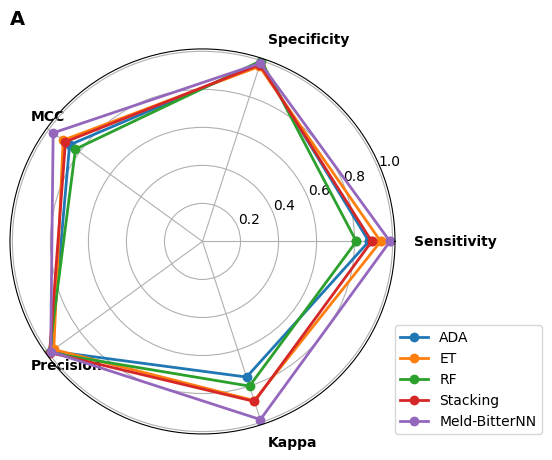

In [ ]:
import matplotlib.pyplot as plt

# Sample data (replace this with your actual data)
data = {
    'Model': ['ADA', 'ET', 'RF', 'Stacking', 'Meld-BitterNN'],
    'Accuracy': [0.929, 0.953, 0.904, 0.942, 0.985],  # Add a placeholder value for DeepDPI
    'Sensitivity': [0.875, 0.937, 0.809, 0.890, 0.986],  # Add a placeholder value for DeepDPI
    'Specificity': [0.984, 0.968, 1.00, 0.978, 0.986],  # Add a placeholder value for DeepDPI
    'MCC': [0.864, 0.906, 0.826, 0.891, 0.971],  # Add a placeholder value for DeepDPI
    'Precision': [0.982, 0.967, 0.996, 0.994, 0.987],  # Add a placeholder value for DeepDPI
    'Kappa': [0.75, 0.88, 0.80, 0.885,0.985]  # Add a placeholder value for DeepDPI
}

# Define metrics and models
metrics = list(data.keys())[2:]
models = data['Model']

# Number of models and metrics
num_models = len(models)
num_metrics = len(metrics)

# Create a polar plot
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'}, figsize=(5, 5))

# Set angles for each metric
angles = np.linspace(0, 2 * np.pi, num_metrics, endpoint=False).tolist()
angles += angles[:1]  # Repeat the first angle to close the circle

# Plot the data with style
for i, model in enumerate(models):
    values = [data[metric][i] for metric in metrics]  # Extract values for each model
    values += values[:1]  # Repeat the first value to close the circle
    line, = ax.plot(angles, values, label=model, marker='o', linestyle='-', linewidth=2)

# Set the labels for each metric
# Set the labels for each metric outside the circle
ax.set_thetagrids(np.degrees(angles[:-1]), metrics, fontweight='bold', va='center', ha='left')

# Add a legend outside the full circle
ax.legend(loc='upper right', bbox_to_anchor=(1.4, 0.3))

# Show the plot
title = plt.title('A', fontsize=14, fontweight='bold')
title.set_position((0.02, 1.02))
plt.savefig('polar_plot.png', dpi=300, bbox_inches='tight')

# Display the saved figure
plt.show()



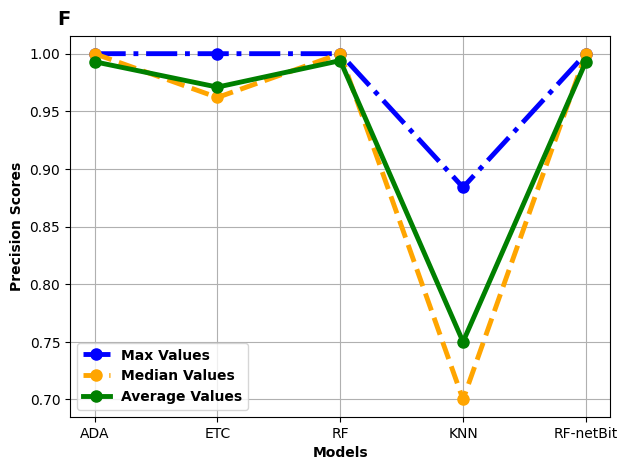

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data


average_values = [0.993, 0.971, 0.994, 0.750, 0.993]
median_values = [1.00, 0.962, 1.00, 0.700, 1.00]
max_values = [1.00, 1.00, 1.00, 0.884, 1.00]

models = ['ADA', 'ETC', 'RF', 'KNN', 'RF-netBit']

# Set wider line width and font weight
line_width = 3.5
font_weight = 'bold'

# Plot lines for each metric with adjusted line width and identical circle markers
plt.plot(models, max_values, marker='o', label='Max Values', linestyle='-.', color='blue', markersize=8, linewidth=line_width)
plt.plot(models, median_values, marker='o', label='Median Values', linestyle='--', color='orange', markersize=8, linewidth=line_width)
plt.plot(models, average_values, marker='o', label='Average Values', linestyle='-', color='green', markersize=8, linewidth=line_width)

# Add labels and title with bold text
plt.xlabel('Models', fontweight=font_weight)
plt.ylabel('Precision Scores', fontweight=font_weight)
plt.text(0, 1.02, 'F', transform=plt.gca().transAxes, fontsize=14, weight=font_weight,
         verticalalignment='bottom', horizontalalignment='right')

# Add legend with bold text and align to left bottom
plt.legend(loc='lower left', prop={'weight': font_weight})

# Show the plot
plt.grid(True)
plt.tight_layout()

# Save the figure with high DPI and pixel dimensions
plt.savefig('B.png', dpi=600, bbox_inches='tight')

# Display the plot
plt.show()
